#<h2>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h2>
<h3>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

# Όνομα: Χρυσοβαλάντης-Κων/νος
# Επίθετο: Ανδρεάς
# Α.Μ: 03118102

In [ ]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from sklearn.cluster import SpectralClustering

#<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr>
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr>

</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4>
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

In [ ]:
n=80
d=4
M=300
R=0.25
p=0.3
k=4
seedno=5
random.seed(seedno)

REG = nx.watts_strogatz_graph(n,d,0, seed=seedno)

RGER = nx.gnm_random_graph(n, M, seed=seedno)

RGG = nx.random_geometric_graph(n, R, seed=seedno)

SF = nx.barabasi_albert_graph(n, d, seed=seedno)

SW = nx.watts_strogatz_graph(n, d, p, seed=seedno)

topologies=[REG, RGER, RGG, SF, SW]

#check if all the graphs are connected
for i in topologies:
  print(nx.is_connected(i))

True
True
True
True
True


##<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
football=nx.read_gml(r"/content/drive/MyDrive/sca/football.gml")

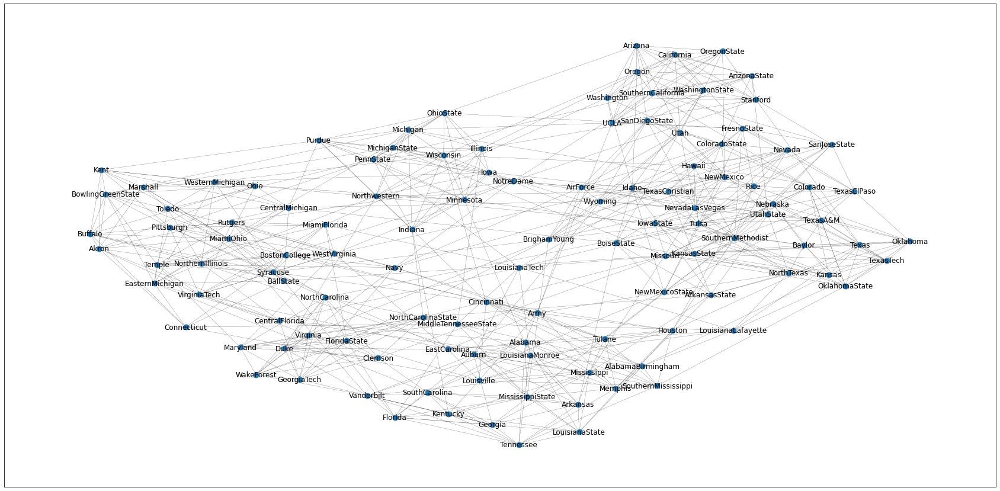

In [ ]:
plt.figure(figsize=(30,15))
nx.draw_networkx(football, node_size=80, with_labels=True, width=.2)
plt.show()

In [ ]:
#Game of thrones network
import csv
got=nx.Graph()
with open('/content/drive/MyDrive/sca/got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1

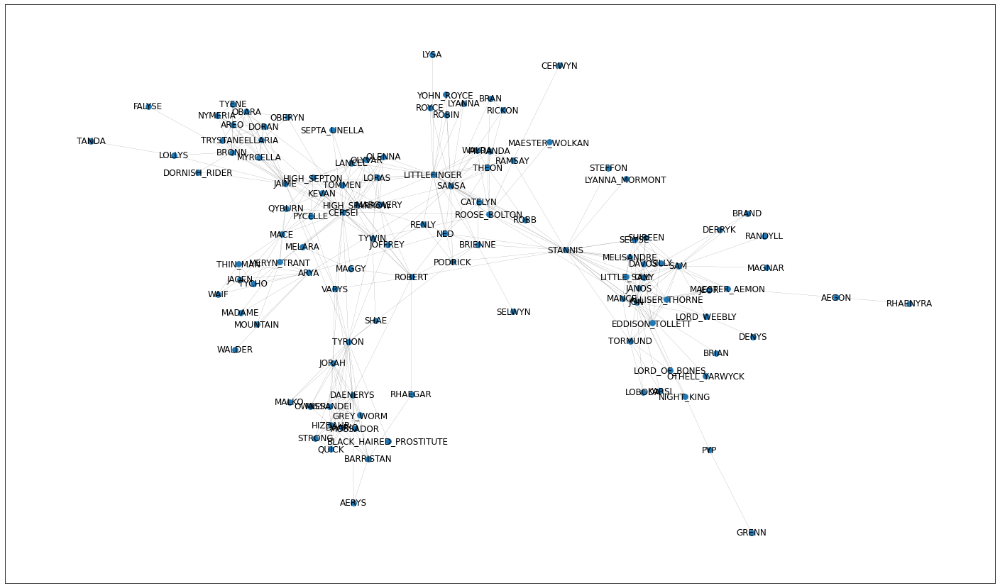

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx(got, node_size=60, with_labels=True, width=.1)
plt.show()

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

In [ ]:
#email-Eu-core network
eu=nx.read_edgelist("/content/drive/MyDrive/sca/email-Eu-core.txt",create_using=nx.Graph())

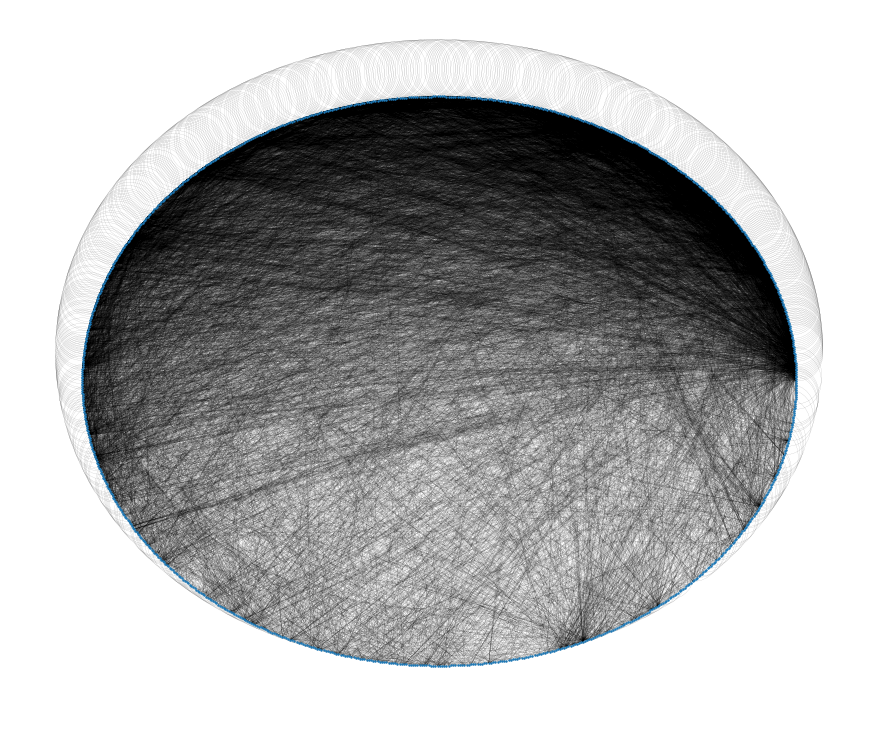

In [ ]:
plt.figure(figsize=(12,10))
nx.draw_circular(eu, node_size=2, with_labels=False, width=.06)
plt.show()

Αφαιρούμε τα self loops και ξανά απεικονίζουμε τα γράφιμα.

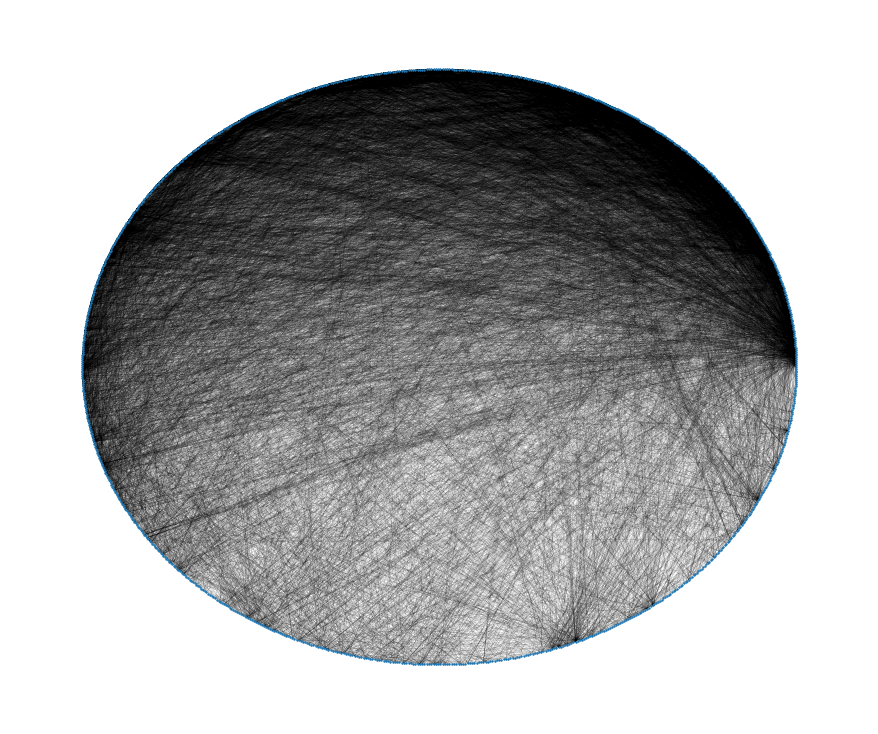

In [ ]:
#αφαίρεση self-loops
eu.remove_edges_from(nx.selfloop_edges(eu))

#επιλέγουμε την μεγαλύτερη συνιστώσα από το σύνολο συνιστωσών
#που επιστρέφει η συνάρτηση connected_components
largest_cc = max(nx.connected_components(eu), key=len)
eu_sub = eu.subgraph(largest_cc).copy()

plt.figure(figsize=(12,10))
nx.draw_circular(eu_sub, node_size=2, with_labels=False, width=.06)
plt.show()

##<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

In [ ]:
def find_degree(G):
    degree_centr_dic = nx.degree_centrality(G)
    degree_centr = []
    for nodes in degree_centr_dic:
      degree_centr.append(degree_centr_dic[nodes])

    mean_node_degree = np.mean(degree_centr)
    var_node_degree = np.var(degree_centr)
    print("""
    mean node degree: {:.4f}
    var: {:.4f}
    """.format(mean_node_degree, var_node_degree)
    )
    plt.hist(degree_centr)
    plt.title("Node Degree Centrality")
    plt.xlabel("Degree Centrality")
    plt.ylabel("Nodes")


    mean node degree: 0.0506
    var: 0.0000
    


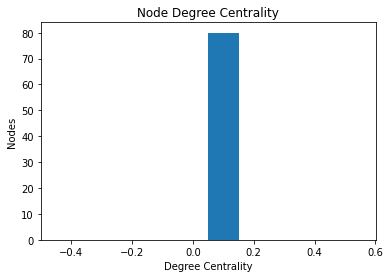

In [ ]:
find_degree(REG)


    mean node degree: 0.0949
    var: 0.0013
    


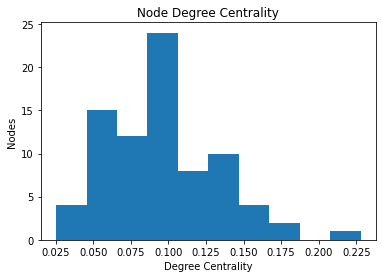

In [ ]:
find_degree(RGER)


    mean node degree: 0.1424
    var: 0.0022
    


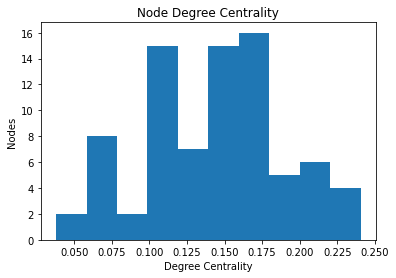

In [ ]:
find_degree(RGG)


    mean node degree: 0.0962
    var: 0.0054
    


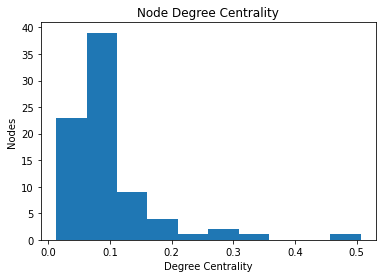

In [ ]:
find_degree(SF)


    mean node degree: 0.0506
    var: 0.0001
    


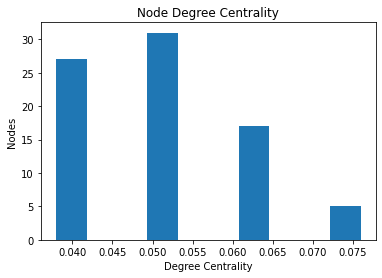

In [ ]:
find_degree(SW)


    mean node degree: 0.0935
    var: 0.0001
    


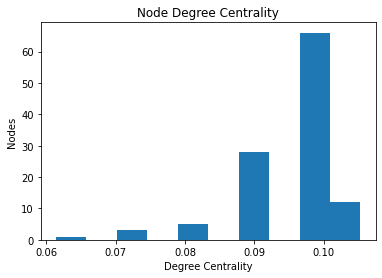

In [ ]:
find_degree(football)


    mean node degree: 0.0564
    var: 0.0022
    


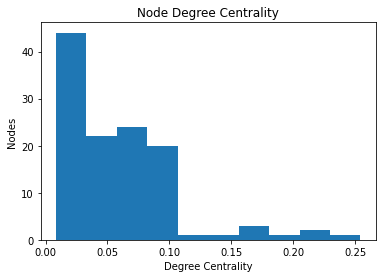

In [ ]:
find_degree(got)


    mean node degree: 0.0331
    var: 0.0014
    


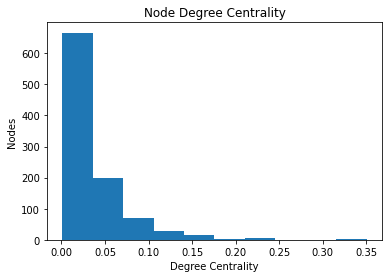

In [ ]:
find_degree(eu_sub)

Football

Για το δίκτυο football παρατηρούμε πώς ο μέσος βαθμός κόμβου είναι πολύ κοντά με τον μέσο βαθμό κόμβου της τοπολογίας RGER και η διακύμανση ίδια με αυτή της τοπολογίας small world. Από την κατνομή των βαθμών κόμβων δεν μπορούμε να εξάγουμε κάποια πληροφορία σχετικά με το σε ποιά τοπολογία ανήκει.

Got

Για το δίκτυο got παρατηρούμε πώς ο μέσος βαθμός κόμβου είναι πολύ κοντά σε αυτό της τοπολογίας SW και η διασπορά είναι ίδια με αυτή της τοπολογίας RGG. Τέλος, η κατανομή των βαθμών κόμβων μοιάζει με αυτή της κατανομής SF με τον μεγαλύτερο πλήθος τιμών να είναι συγκεντρωμένο σε τιμές κοντά στο μηδέν.

Eu-core

Για το δίκτυο eu core παρατητούμε πώς η κατανομή των βαθμών κόμβων είναι power law, δηλαδή μοιάζει με την τοπολογία SF. Οι μεγαλύτερες τιμές του μέσου βαθμού κόμβου οφείλονται στο μεγαλύτερο πλήθος κόμβων του δικτύου σε σχέση με τους κόμβους της τοπολογίας SF.

##<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

In [ ]:
def cc(G):
    node_clusters_dic = nx.clustering(G)
    node_clusters = []
    for node in node_clusters_dic:
      node_clusters.append(node_clusters_dic[node])
    #print("node_clusters_dic: {}".format(node_clusters_dic))
    #print("node_clusters: {}".format(node_clusters))
    mean = np.mean(node_clusters)
    var = np.var(node_clusters)

    max_node = max(node_clusters_dic, key=node_clusters_dic.get)
    min_node = min(node_clusters_dic, key=node_clusters_dic.get)
    max_node_value = max(node_clusters)
    min_node_value = min(node_clusters)
    print("""
    Mean cc = {:.4f}
    var = {:.4f}
    Node with max cc is {}, with value of {:.4f}
    Node with min cc is {}, with value of {:.4f}
    """.format(mean, var, max_node, max_node_value, min_node, min_node_value)
    )
    plt.hist(node_clusters)
    plt.title("Node Clustering coefficients")
    plt.xlabel("Clustering coefficient")
    plt.ylabel("Nodes")


    Mean cc = 0.5000
    var = 0.0000
    Node with max cc is 0, with value of 0.5000
    Node with min cc is 0, with value of 0.5000
    


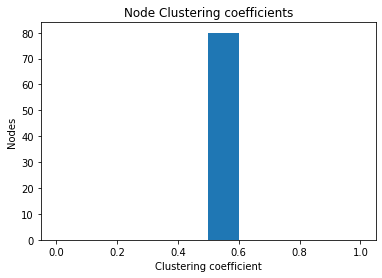

In [ ]:
cc(REG)


    Mean cc = 0.0850
    var = 0.0043
    Node with max cc is 58, with value of 0.2381
    Node with min cc is 2, with value of 0.0000
    


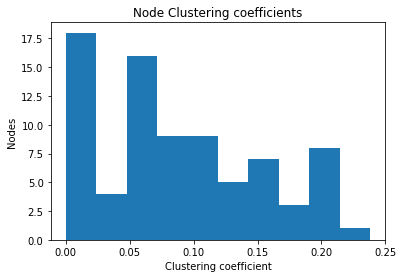

In [ ]:
cc(RGER)


    Mean cc = 0.6826
    var = 0.0207
    Node with max cc is 29, with value of 1.0000
    Node with min cc is 12, with value of 0.4667
    


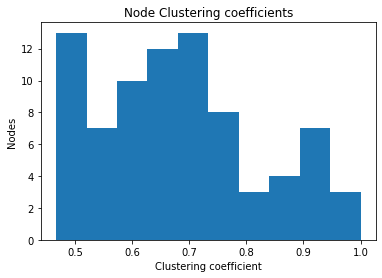

In [ ]:
cc(RGG)


    Mean cc = 0.2292
    var = 0.0289
    Node with max cc is 19, with value of 0.8333
    Node with min cc is 3, with value of 0.0000
    


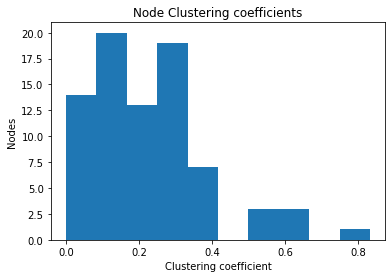

In [ ]:
cc(SF)


    Mean cc = 0.1671
    var = 0.0281
    Node with max cc is 41, with value of 0.6667
    Node with min cc is 0, with value of 0.0000
    


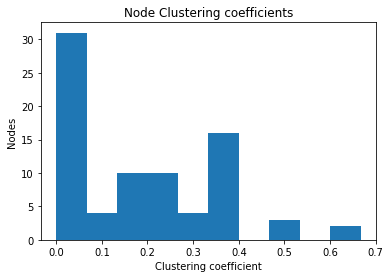

In [ ]:
cc(SW)


    Mean cc = 0.4032
    var = 0.0108
    Node with max cc is WakeForest, with value of 0.6667
    Node with min cc is LouisianaTech, with value of 0.1111
    


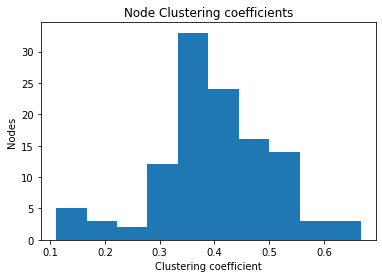

In [ ]:
cc(football)


    Mean cc = 0.5744
    var = 0.1261
    Node with max cc is MYRANDA, with value of 1.0000
    Node with min cc is BLACK_HAIRED_PROSTITUTE, with value of 0.0000
    


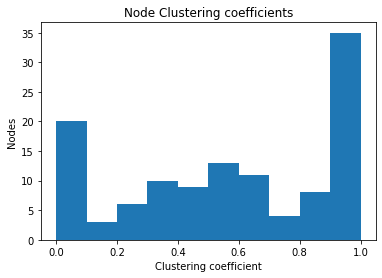

In [ ]:
cc(got)


    Mean cc = 0.4071
    var = 0.0614
    Node with max cc is 348, with value of 1.0000
    Node with min cc is 449, with value of 0.0000
    


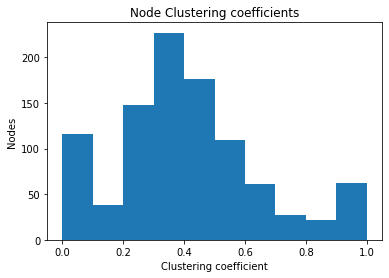

In [ ]:
cc(eu_sub)

Η σημαντική διαφορά του αριθμού των κόμβων των πραγματικών δικτύων με αυτούς των συνθετικών δικτύων δυσκολεύουν την σύγκρισή τους.

Football

Παρατηρήσουμε πώς η πλειοψηφία των τιμών βρίσκεται γύρω από την μέση τιμή, με σχετικά σταδιακή μείωση όσο απομακρυνόμαστε από αυτή. Επίσης, η μέση τιμή πλισιάζει αυτή της REG τοπολογίας και η διασπορά αυτή της SW.

Got

Στο πραγματικό δίκτυο got η κατανομή του clustering coefficient δεν μοιάζει ακριβώς με κάποια από τις συνθετικές τοπολογίες. Παρατηρούμε όμως, πώς υπάρχει μια σημαντική συγκέντρωση τιμών γύρω από τις τιμές 0 και 1. Επίσης, για τις υπόλοιπες τιμές η κατανομή του cc φαίνεται σχεδόν κανονική. Θα μπορούσαμε λοιπόν να σχολιάσουμε πώς αν εξαιρέσουμε τον σημαντικό αριθμό τιμών που βρίσκονται κοντά στο 1, το δίκτυο μοιάζει με SF τοπολογία. 

Eu

Το δίκτυο αυτό μοιάζει αρκετά με το got με την διαφορά πώς έχουμε λιγότερο ποσοστό τιμών στα άκρα και περισσότερο στο κεντρικό κομμάτι της κατανομής η οποία επίσης ακολουθεί γκαουσιανή κατανομή. Επομένως, αντίστοιχα με το δίκτυο got η κατανομή μοιάζει με αυτό της SF τοπολογίας.

##<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

In [ ]:
def find_closeness(G):
    closeness_centr_dic = nx.closeness_centrality(G)
    closeness_centr = []
    for nodes in closeness_centr_dic:
      closeness_centr.append(closeness_centr_dic[nodes])

    mean = np.mean(closeness_centr)
    var = np.var(closeness_centr)
    print("""
    mean closeness centrality: {:.4f}
    var: {:.4f}
    """.format(mean, var)
    )
    plt.hist(closeness_centr)


    mean closeness centrality: 0.0963
    var: 0.0000
    


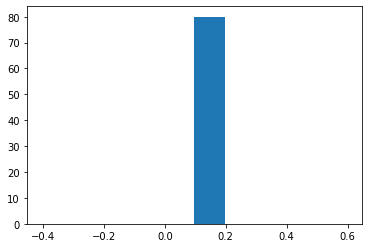

In [ ]:
find_closeness(REG)


    mean closeness centrality: 0.4242
    var: 0.0014
    


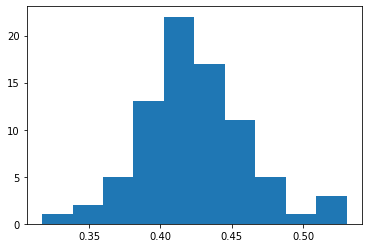

In [ ]:
find_closeness(RGER)


    mean closeness centrality: 0.3201
    var: 0.0024
    


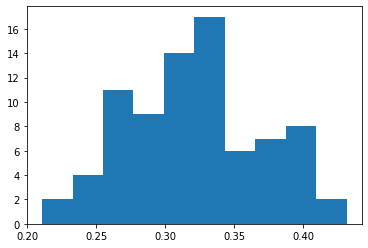

In [ ]:
find_closeness(RGG)


    mean closeness centrality: 0.4464
    var: 0.0027
    


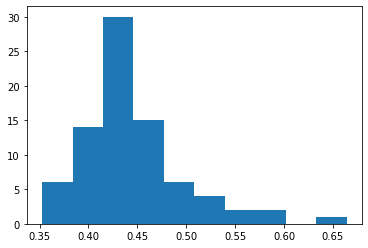

In [ ]:
find_closeness(SF)


    mean closeness centrality: 0.2691
    var: 0.0003
    


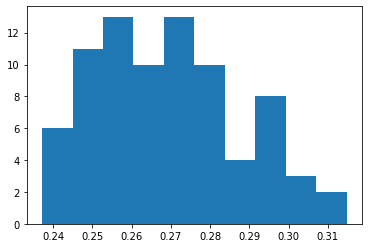

In [ ]:
find_closeness(SW)


    mean closeness centrality: 0.3993
    var: 0.0002
    


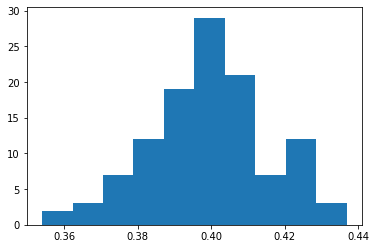

In [ ]:
find_closeness(football)


    mean closeness centrality: 0.3191
    var: 0.0027
    


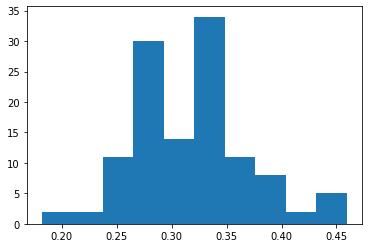

In [ ]:
find_closeness(got)


    mean closeness centrality: 0.3945
    var: 0.0030
    


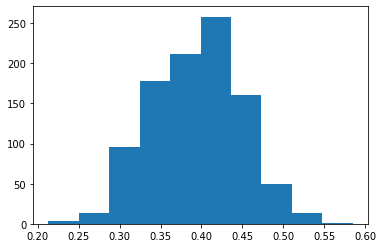

In [ ]:
find_closeness(eu_sub)

Football

Η κατανομή μοίαζει αρκετά με αυτή της τοπολογίας RGER και SF με τις περισσότερες τιμές να έιναι συγκεντρωμένες γύρω από την μέση τιμή. Επίσης, η τιμή της διασποράς είναι σχεδόν ίδια με αυτή της SF τοπολογίας.

Got

Η κατανομή του πραγματικού δικτύου got είναι παρόμοια με αυτή του συνθετικού δικτύου RGG καθώς και οι τιμές του μέσου βαθμού εγγύτητας και της διασποράς είναι σχεδόν ίδιες.

Eu

Η κατανομή μοιάζει να είναι αρκετά όμοι με αυτή της τοπολογίας RGER, με την διασπορά όμως να προσεγγίζει πολύ κοντά αυτής της τοπολογίας SF.

Συμπερασματικά, μπορούμε να πούμε πώς το δίκτυο Football μοιάζει περισσότερο να ανήκει είτε στην συνθετική τοπολογία RGER είτε στην SW. Το δίκτυο got μοιάζει περισσότερο να ανήκει στην συνθετική τοπολογία SF και τέλος το Eu, αντίστοιχα με το δίκτυο got, φαινέται να τείνει πρός την Scale Free τοπολογία.

# B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε τις βιωλιοθήκες <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a> και <a style=text-decoration:none href='https://docs.python.org/3/library/time.html'>time</a> . Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>
<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>


<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [ ]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικές τοπολογίες σε integers
def conv2int(G,start_value):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping

In [ ]:
football_int,football_map = conv2int(football,0)
got_int,got_map = conv2int(got,0)
eu_sub_int,eu_sub_map = conv2int(eu_sub,0)

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [ ]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())

Ορίζουμε 3 λεξικά στα οποία θα αποθηκεύουμε τις καλύτερες διαμερίσεις της κάθε μεθόδου με βάση την μετρική performance και modularity. Στο λεξικό time θα αποθηκεύουμε τον χρόνο που χρειάστηκε για τον υπολογισμό της κάθε διαμέρισης.

In [ ]:
graphs = ["REG", "RGER", "RGG", "SF", "SW", "football", "got", "eu_sub"]
methods = ["Newman-Girvan", "Spectral-Clustering", "Modularity-Maximization"]
top = [REG, RGER, RGG, SF, SW, football_int, got_int, eu_sub_int]

performance_dic =  {}
modularity_dic = {}
time_dic = {}

for G in graphs:
  performance_dic[G] = {}
  modularity_dic[G] = {}
  time_dic[G] = {}

  performance_dic[G] = {"Newman-Girvan": 0,
                        'Spectral-Clustering': 0,
                        'Modularity-Maximization': 0}
  modularity_dic[G] = {"Newman-Girvan": 0,
                       'Spectral-Clustering': 0,
                       'Modularity-Maximization': 0}
  time_dic[G] = {"Newman-Girvan": 0,
                 'Spectral-Clustering': 0,
                 'Modularity-Maximization': 0}

print(performance_dic)
print(modularity_dic)
print(time_dic)

{'REG': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'RGER': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'RGG': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'SF': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'SW': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'football': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'got': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'eu_sub': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}}
{'REG': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'RGER': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'RGG': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'Modularity-Maximization': 0}, 'SF': {'Newman-Girvan': 0, 'Spectral-Clustering': 0, 'M

Ορίζουμε μια συνάρτηση που θα τυπώνει σε πόση ώρα βρέθηκαν οι κοινότητες που ψάχνουμε με βάση την εκάστοτε μέθοδο.

In [ ]:
def comp_print(method):
  if method == methods[0]:
    for G in range(8):
      start_time = time.time()
      performance_dic[graphs[G]][method] = girvan_newman_performance(top[G])
      modularity_dic[graphs[G]][method] = girvan_newman_modularity(top[G])
      time_dic[graphs[G]][method] = time.time() - start_time

      print("Found communities in {} network in: {:.2f} sec".format(graphs[G], time_dic[graphs[G]][method]))
      print("")

  elif method == methods[1]:
    for G in range(8):
      start_time = time.time()
      performance_dic[graphs[G]][method] = spectral_clustering_performance(top[G])
      modularity_dic[graphs[G]][method] = spectral_clustering_modularity(top[G])
      time_dic[graphs[G]][method] = time.time() - start_time

      print("Found communities in {} network in: {:.2f} sec".format(graphs[G], time_dic[graphs[G]][method]))
      print("")

  elif method == methods[2]:
    per=[]
    for G in range(8):
      start_time = time.time()
      performance_dic[graphs[G]][method] = modularity_max_performance(top[G])
      modularity_dic[graphs[G]][method] = modularity_max_modularity(top[G])
      time_dic[graphs[G]][method] = time.time() - start_time

      print("Found communities in {} network in: {:.2f} sec".format(graphs[G], time_dic[graphs[G]][method]))
      print("")

##<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p>
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [ ]:
import itertools
import time
from tqdm.notebook import tqdm
import networkx.algorithms.community as nx_comm
from networkx.algorithms.community.centrality import girvan_newman


def girvan_newman_performance(G):
  k=50
  method = girvan_newman(G)
  partitions=[]

  for partition in tqdm(itertools.islice(method, k), total=k):
    (_,performance) = nx_comm.partition_quality(G, partition)
    partitions.append((partition, performance))

  #return the partition with the highest score
  best = max(partitions,key=lambda x: x[1])
  return best



def girvan_newman_modularity(G):
  k=50
  method = girvan_newman(G)
  partitions=[]

  for partition in tqdm(itertools.islice(method, k), total=k):
    modularity = nx_comm.quality.modularity(G, partition)
    partitions.append((partition, modularity))

  #return the partition with the highest score
  best = max(partitions,key=lambda x: x[1])
  return best

In [ ]:
comp_print(methods[0])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in REG network in: 1.43 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in RGER network in: 12.07 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in RGG network in: 5.72 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in SF network in: 7.37 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in SW network in: 1.95 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in football network in: 17.39 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in got network in: 6.25 sec



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Found communities in eu_sub network in: 1480.91 sec



Παρατηρούμε πώς στο δίκτυο eu ο αλγόριθμος Newman-Girvan χρείαζεται σημαντικό περισσότερο χρόνο σε σχέση με τις υπόλοιπες τοπολογίες, οι οποίες ολοκληρώνονται σε μερικά δευτερόλπετα.

##<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,|V|$. Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [ ]:
def spectral_clustering_performance(G):
  k = 50
  partitions = []

  #initialize cluster list
  n_clusters = [n for n in range(2, k+1)]

  #adjacency matrix
  X = nx.to_numpy_array(G)

  for n in tqdm(n_clusters):
    clf = SpectralClustering(n_clusters=n, affinity='precomputed').fit(X)

    clusters = []
    clusters = [[x for x in range(len(clf.labels_)) if clf.labels_[x]==i] for i in np.unique(clf.labels_)]
    (_,performance) = nx.community.partition_quality(G, clusters)
    partitions.append((clusters, performance))

  best = max(partitions,key=lambda x: x[1])
  return best


def spectral_clustering_modularity(G):
  k = 50
  partitions = []

  #initialize cluster list
  n_clusters = [n for n in range(2, k+1)]

  #adjacency matrix
  X = nx.to_numpy_array(G)

  for n in tqdm(n_clusters):
    clf = SpectralClustering(n_clusters=n, affinity='precomputed').fit(X)

    clusters = []
    clusters = [[x for x in range(len(clf.labels_)) if clf.labels_[x]==i] for i in np.unique(clf.labels_)]
    modularity = nx.community.quality.modularity(G, clusters)
    partitions.append((clusters, modularity))

  best = max(partitions,key=lambda x: x[1])
  return best

In [ ]:
comp_print(methods[1])

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in REG network in: 10.01 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in RGER network in: 9.91 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in RGG network in: 8.41 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in SF network in: 9.05 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in SW network in: 8.83 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in football network in: 19.35 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in got network in: 17.64 sec



  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Found communities in eu_sub network in: 85.12 sec



Παρατηρούμε πώς με εξαίρεση τα δίκτυα Eu core και RGER χρειάστηκε περισσότερος χρόνος για να υπολογιστούν οι κοινότητες.

##<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

def modularity_max_performance(G):
  partition = nx_comm.modularity_max.greedy_modularity_communities(G)
  (_, performance) = nx_comm.partition_quality(G, partition)
  return partition, performance


def modularity_max_modularity(G):
  partition = nx_comm.modularity_max.greedy_modularity_communities(G)
  modularity = nx_comm.quality.modularity(G, partition)
  return partition, modularity

In [ ]:
comp_print(methods[2])

Found communities in REG network in: 0.03 sec

Found communities in RGER network in: 0.06 sec

Found communities in RGG network in: 0.05 sec

Found communities in SF network in: 0.06 sec

Found communities in SW network in: 0.03 sec

Found communities in football network in: 0.11 sec

Found communities in got network in: 0.08 sec

Found communities in eu_sub network in: 11.23 sec



Τέλος η μέθος modularity maximization χρειάστηκε σημαντικά λιγότερο χρόνο σε σχέση με ττις άλλες δύο μεθόδους, κάτι που μπορεί να δικαιολογηθεί από την greedy φύση του αλγορίθμου

## Οπτικοποίηση Κοινοτήτων

#### Συγκεντρωτική Παρουσίαση και Οπτικοποίηση των Αποτελεσμάτων των Μετρικών

In [ ]:
print('Performance Metric''\n')
for method in methods:
  print(str(method)+':''\n')
  for G in graphs:
    print("For the {} Network the Number of communities is: {} & Performance score is: {:.2f}"'\n'
    .format(G, len(performance_dic[G][method][0]), performance_dic[G][method][1]))

Performance Metric

Newman-Girvan:

For the REG Network the Number of communities is: 16 & Performance score is: 0.97

For the RGER Network the Number of communities is: 34 & Performance score is: 0.92

For the RGG Network the Number of communities is: 22 & Performance score is: 0.93

For the SF Network the Number of communities is: 43 & Performance score is: 0.92

For the SW Network the Number of communities is: 31 & Performance score is: 0.97

For the football Network the Number of communities is: 17 & Performance score is: 0.96

For the got Network the Number of communities is: 51 & Performance score is: 0.96

For the eu_sub Network the Number of communities is: 51 & Performance score is: 0.14

Spectral-Clustering:

For the REG Network the Number of communities is: 23 & Performance score is: 0.97

For the RGER Network the Number of communities is: 30 & Performance score is: 0.92

For the RGG Network the Number of communities is: 10 & Performance score is: 0.94

For the SF Network th

Παρατηρούμε πώς από τις τρεις μεθόδους, στην μετρική performance καλύτερη επίδοση έχουν οι μέθοδοι Newman-Girvan και Spectral Clustering με σχεδόν πανομοιότυπα αποτελέσματα. Εξαίρεση σε αυτό αποτελεί το δίκτυο Eu το οποίο εμφανίζει πολύ χαμηλή απόδοση στην μέθοδο Newman Girvan. Αυτό οφείλεται στο γεγονός πώς η μέθοδος Newman Girvan εντοπίζει κοινότητες αφαιρώντας σταδιακά ακμές από τον αρχικό γράφο. Επομένως λόγω του μεγάλου πλήθους ακμών στο δίκτυο Eu ο αλγόριθμος δεν προλαβαίνει να παράξει ικανοποιητικά αποτελέσματα καθώς το σταματάμε πολύ νωρίς. Η μέθοδος modularity maximization παράγει χαμηλότυερα αποτελέσματα σε σχέση με τις άλλες δύο μεθόδους, όμως ο χρόνος εκτέλεσής της είναι αμελητέος σε σχέση με τις άλλες δύο. Παρακάτω βλέπουμε την γραφική απεικόνιση των αποτελεσμάτων για την μετρική performance. 

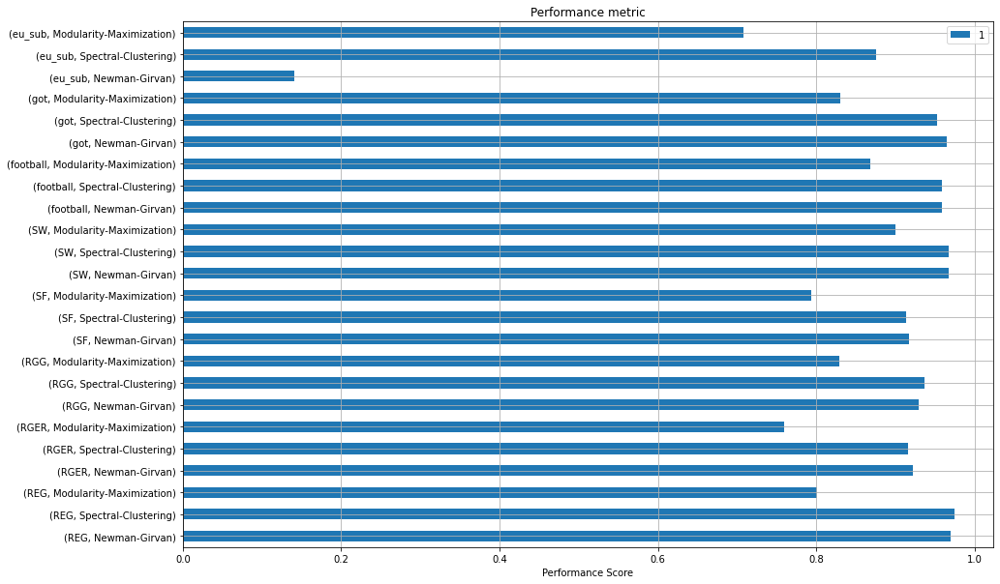

In [ ]:
import pandas as pd
performance_data = pd.concat({
        k: pd.DataFrame.from_dict(v, 'index') for k, v in performance_dic.items()
    },
    axis=0)
performance_data.plot(kind='barh', figsize=(15,10), grid=True)
plt.title("Performance metric")
plt.xlabel("Performance Score")
plt.show()

In [ ]:
print('Modularity Metric''\n')
for method in methods:
  print(str(method)+':''\n')
  for G in graphs:
    print("For the {} Network the Number of communities is: {} & Modularity score is: {:.2f}"'\n'
    .format(G, len(modularity_dic[G][method][0]), modularity_dic[G][method][1]))

Modularity Metric

Newman-Girvan:

For the REG Network the Number of communities is: 8 & Modularity score is: 0.72

For the RGER Network the Number of communities is: 24 & Modularity score is: 0.21

For the RGG Network the Number of communities is: 5 & Modularity score is: 0.60

For the SF Network the Number of communities is: 30 & Modularity score is: 0.14

For the SW Network the Number of communities is: 8 & Modularity score is: 0.57

For the football Network the Number of communities is: 10 & Modularity score is: 0.60

For the got Network the Number of communities is: 8 & Modularity score is: 0.67

For the eu_sub Network the Number of communities is: 2 & Modularity score is: 0.00

Spectral-Clustering:

For the REG Network the Number of communities is: 7 & Modularity score is: 0.72

For the RGER Network the Number of communities is: 8 & Modularity score is: 0.28

For the RGG Network the Number of communities is: 6 & Modularity score is: 0.60

For the SF Network the Number of communit

Σχετικά με τη μετρική modulatity παρατηρούμε πώς τα αποτελέσματα και των τριών μεθόδων είναι αρκετά χαμηλότερα σε σχέση με την μετρική performance. Ενδεικτικά παρτηρούμε πώς στα δίκτυα RGER, SF και Eu τα αποτελέσμτα είναι σημαντικά μικρά με το δίκτυο Eu να αγγίζει το 0.0006.

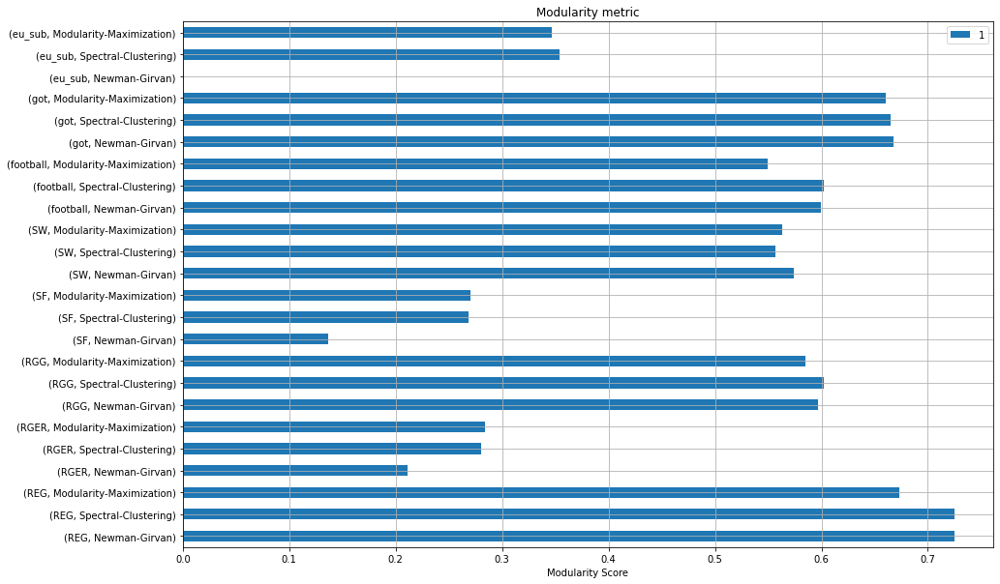

In [ ]:
modularity_data = pd.concat({
        k: pd.DataFrame.from_dict(v, 'index') for k, v in modularity_dic.items()
    },
    axis=0)
modularity_data.plot(kind='barh', figsize=(15,10), grid=True)
plt.title("Modularity metric")
plt.xlabel("Modularity Score")
plt.show()

Συνολικά, λαμβάνοντας υπόψιν και τους χρόνους που χρειάστηκαν για να ολοκληρωθούν οι εκάστοτε μέθοδοι σε συνδυασμό με την ακρίβεια και τον αριθμό κοινοτήτων που εντοπίστηκαν, η μέθοδος Spectral Clustering βγάζει αποτελέσματα πολύ κοντά, αν όχι σχεδόν πανόμοια με την μέθοδο Newman Girvan σε σημαντικά λιγότερο χρόνο. Επίσης, πετυχένει σημαντικά καλύτερα αποτελέσματα στο μεγάλο δίκτυο Eu. Τέλος η μέθοδος Spectral Clustering χρειάστηκε μόλις 80 δευτερόλεπτα για δίκτυο Eu, ενώ η μέθοδος Newman Girvan χρειάστηκε 24 λέπτα.

#### Οπτικοποίηση κοινοτήτων American College Football

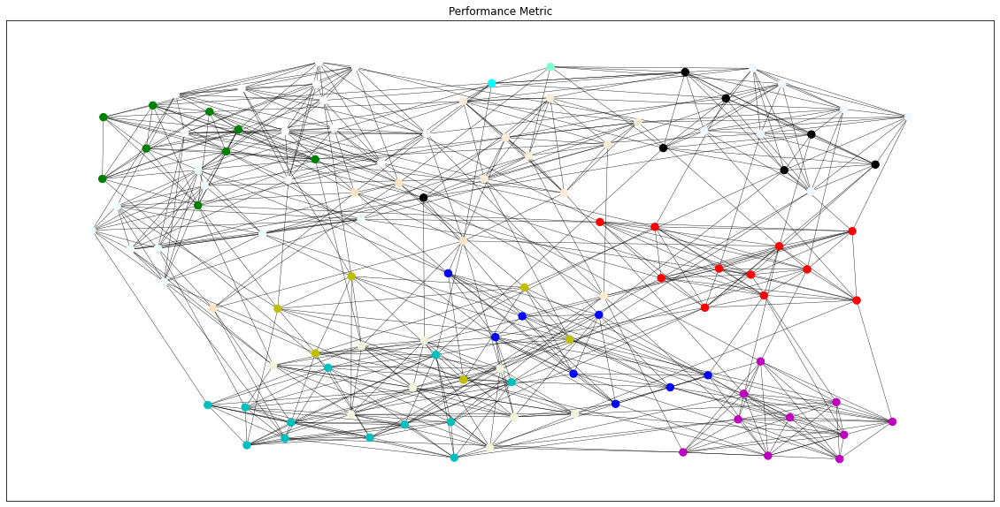

In [ ]:
#Newman-Girvan
football_colors = [0 for i in range(len(nx.nodes(football)))]

for index, community in enumerate(performance_dic["football"]["Newman-Girvan"][0]):
  for node in community:
    football_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(football, node_size=70, width=0.4, node_color=football_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

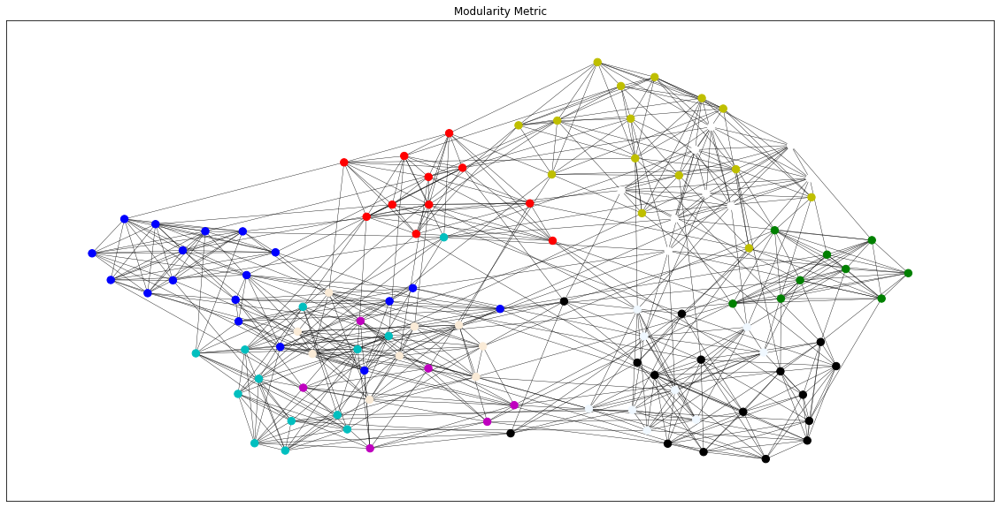

In [ ]:
#Newman-Girvan
football_colors = [0 for i in range(len(nx.nodes(football)))]

for index, community in enumerate(modularity_dic["football"]["Newman-Girvan"][0]):
  for node in community:
    football_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(football, node_size=70, width=0.4, node_color=football_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

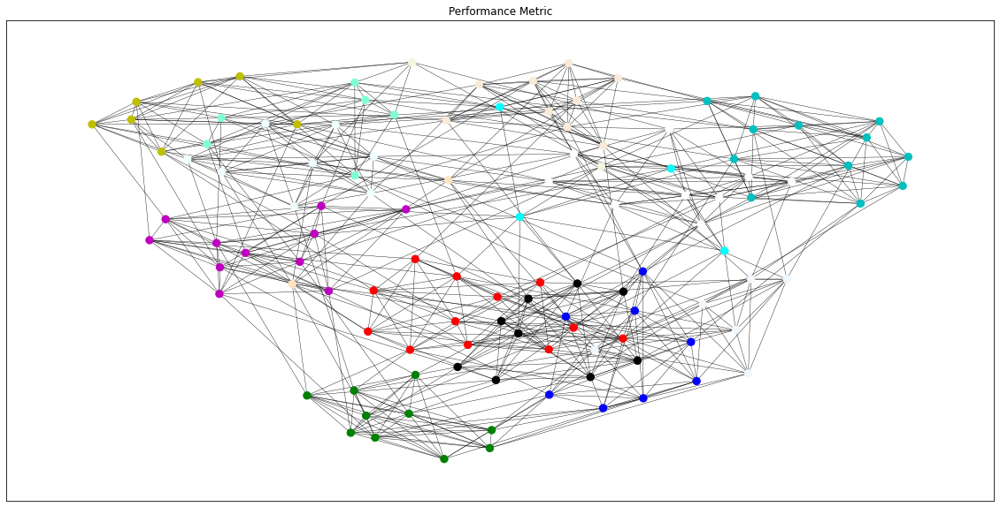

In [ ]:
#Spectral-Clustering
football_colors = [0 for i in range(len(nx.nodes(football)))]

for index, community in enumerate(performance_dic["football"]["Spectral-Clustering"][0]):
  for node in community:
    football_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(football, node_size=70, width=0.4, node_color=football_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

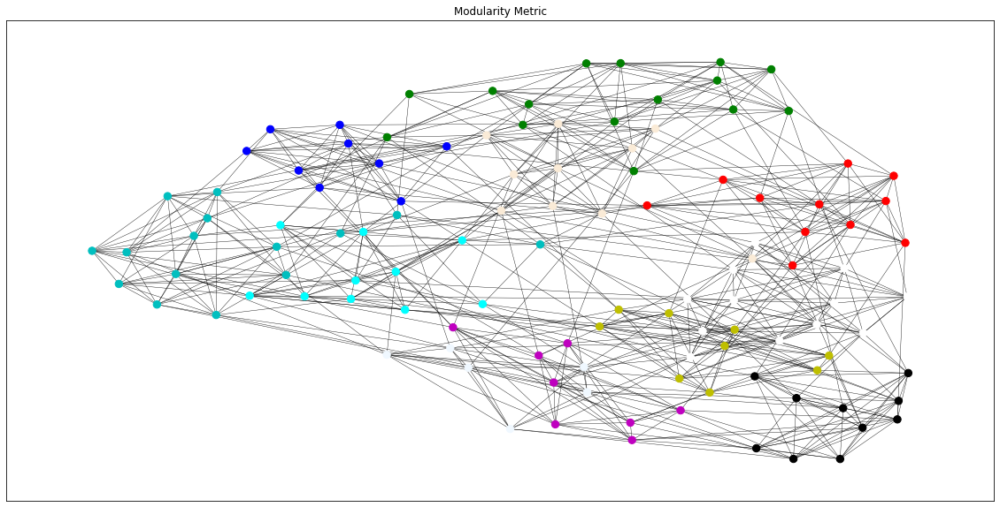

In [ ]:
#Spectral-Clustering
football_colors = [0 for i in range(len(nx.nodes(football)))]

for index, community in enumerate(modularity_dic["football"]["Spectral-Clustering"][0]):
  for node in community:
    football_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(football, node_size=70, width=0.4, node_color=football_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

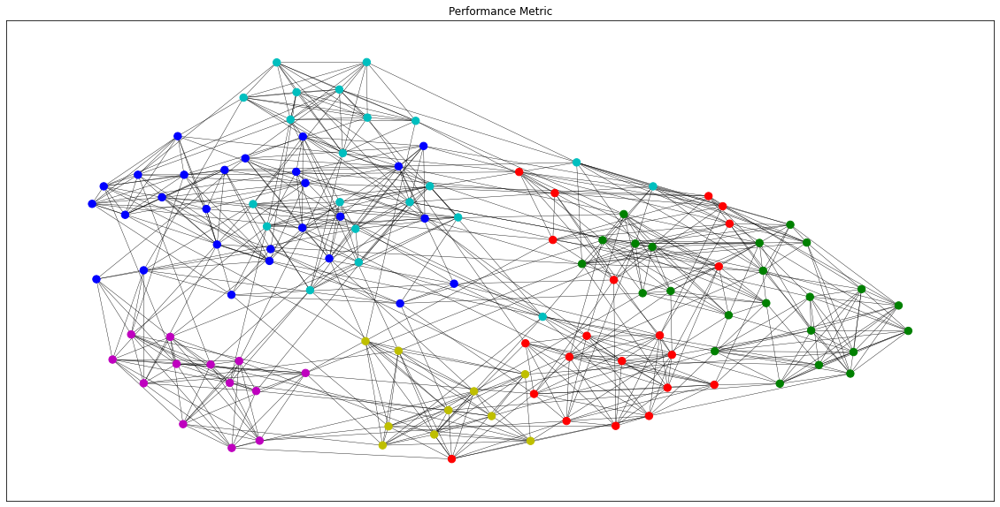

In [ ]:
#Modularity-Maximization
football_colors = [0 for i in range(len(nx.nodes(football)))]

for index, community in enumerate(performance_dic["football"]["Modularity-Maximization"][0]):
  for node in community:
    football_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(football, node_size=70, width=0.4, node_color=football_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

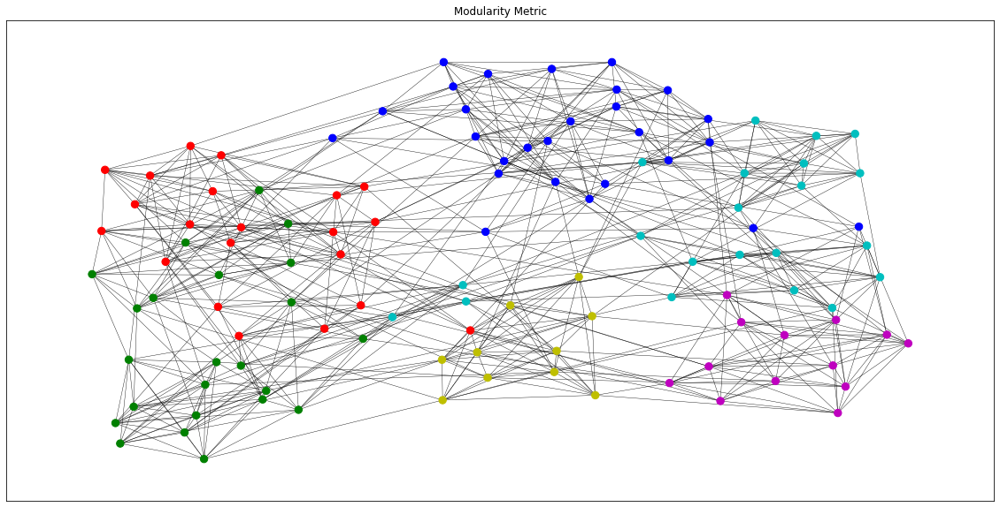

In [ ]:
#Modularity-Maximization
football_colors = [0 for i in range(len(nx.nodes(football)))]

for index, community in enumerate(modularity_dic["football"]["Modularity-Maximization"][0]):
  for node in community:
    football_colors[node] = colors[i]

plt.figure(figsize=(20,10))
plt.title('Modularity Metric')
nx.draw_networkx(football, node_size=70, width=0.4, node_color=football_colors, with_labels=False)
plt.show()

Οπτικοποιώντας το δίκτυο football και παρατηρώντας την ξεάθαρη διάκριση των κόμβων σε κοινότητες με λίγες ακμές να ενώνουν τις κοινότητες μεταξύ τους μπορούμε να συμπεράνουμε πώ το δίκτυο μοιάζει με Small World τοπολογία.

#### Οπτικοποίηση κοινοτήτων Game of Thrones

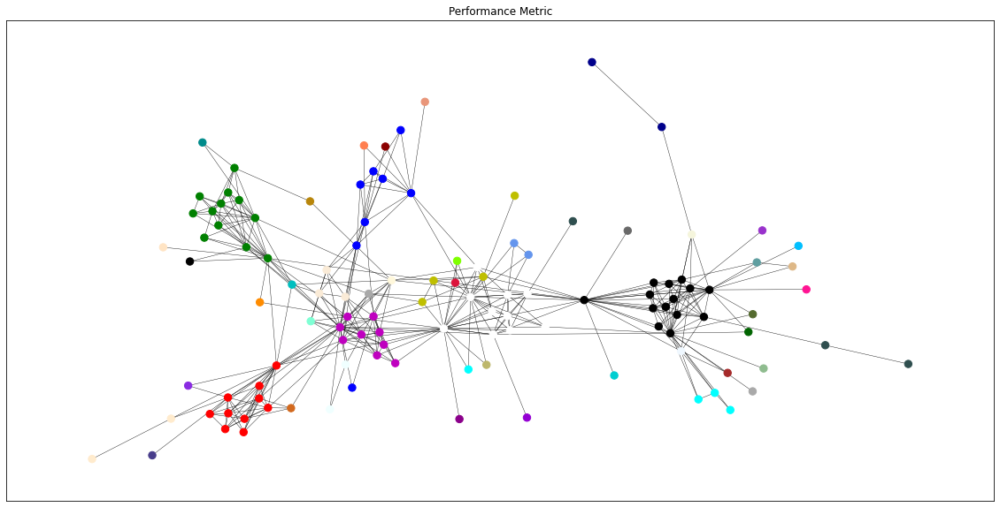

In [ ]:
#Newman-Girvan
got_colors = [0 for i in range(len(nx.nodes(got)))]

for index, community in enumerate(performance_dic["got"]["Newman-Girvan"][0]):
  for node in community:
    got_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(got, node_size=70, width=0.4, node_color=got_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

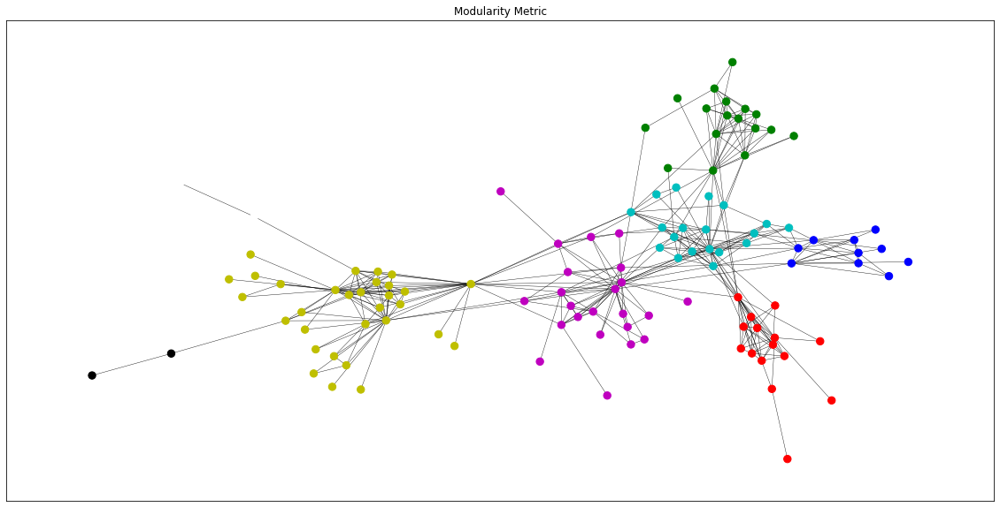

In [ ]:
#Newman-Girvan
got_colors = [0 for i in range(len(nx.nodes(got)))]

for index, community in enumerate(modularity_dic["got"]["Newman-Girvan"][0]):
  for node in community:
    got_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(got, node_size=70, width=0.4, node_color=got_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

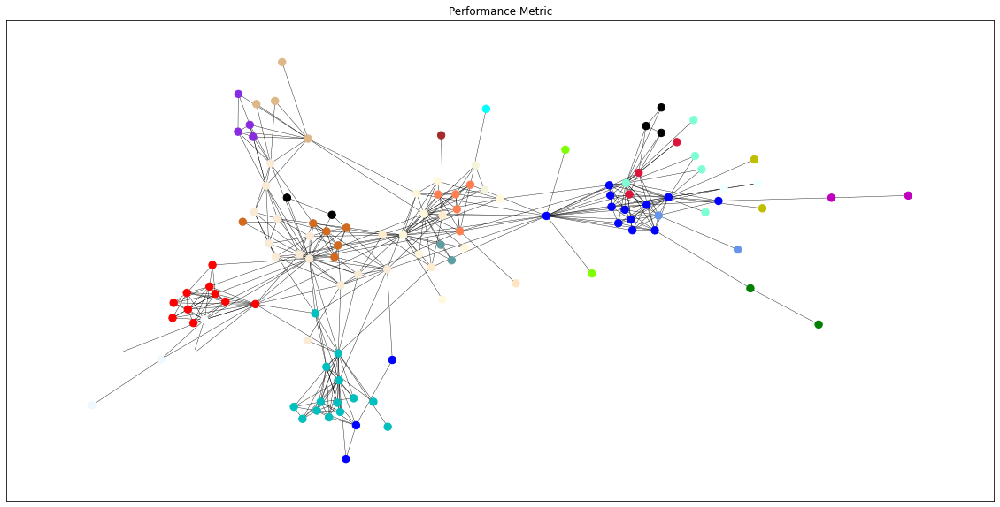

In [ ]:
#Spectral-Clustering
got_colors = [0 for i in range(len(nx.nodes(got)))]

for index, community in enumerate(performance_dic["got"]["Spectral-Clustering"][0]):
  for node in community:
    got_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(got, node_size=70, width=0.4, node_color=got_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

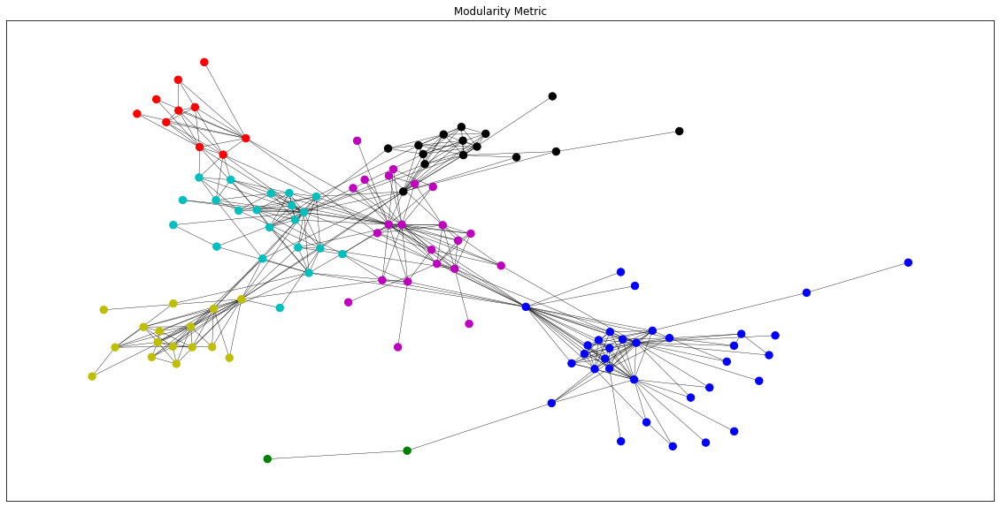

In [ ]:
#Spectral-Clustering
got_colors = [0 for i in range(len(nx.nodes(got)))]

for index, community in enumerate(modularity_dic["got"]["Spectral-Clustering"][0]):
  for node in community:
    got_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(got, node_size=70, width=0.4, node_color=got_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

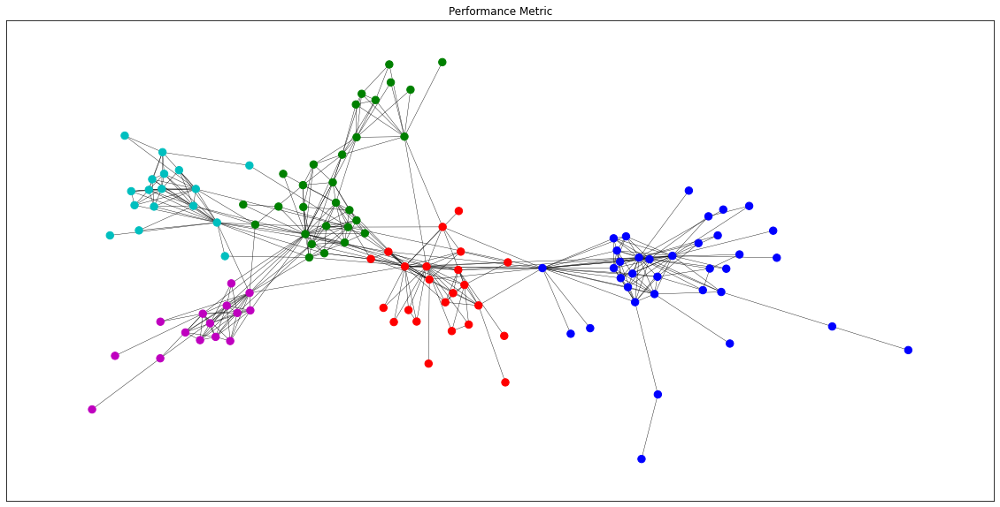

In [ ]:
#Modularity-Maximization
got_colors = [0 for i in range(len(nx.nodes(got)))]

for index, community in enumerate(performance_dic["got"]["Modularity-Maximization"][0]):
  for node in community:
    got_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(got, node_size=70, width=0.4, node_color=got_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

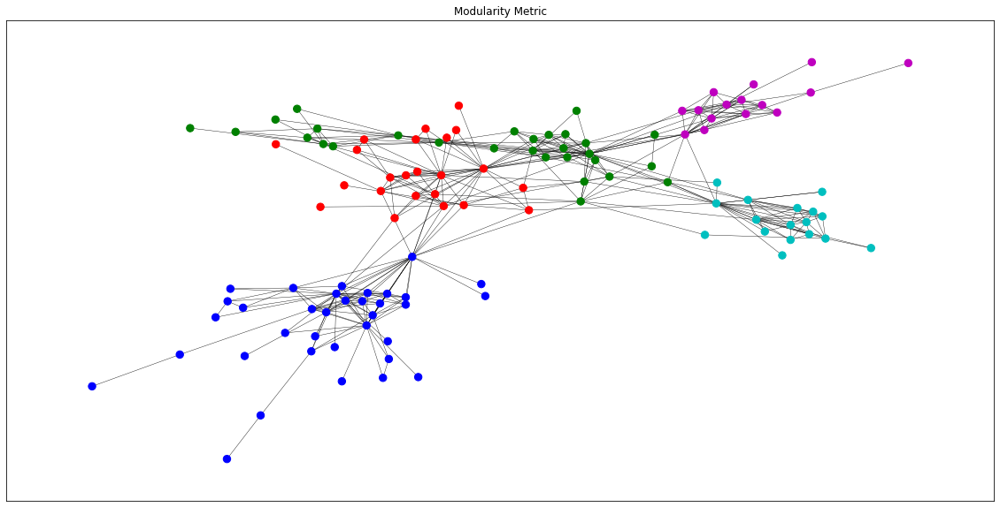

In [ ]:
#Modularity-Maximization
got_colors = [0 for i in range(len(nx.nodes(got)))]

for index, community in enumerate(modularity_dic["got"]["Modularity-Maximization"][0]):
  for node in community:
    got_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(got, node_size=70, width=0.4, node_color=got_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

Στις παραπάνω απεικονίσεις παρατηρούμε πώς υπάρχουν κόμβοι από κάθε κοινότητα οι οποίοι δρουν ως γέφυρες μεταξύ των υπόλοιπων κοινοτήτων. Μπορούμε έτσι να καταλήξουμε στο συμπέρασμα πώς το δίκτυο got μοιάζει με την συνθετική τοπολογία RGG και όχι με την τοπολογία Scale Free που θωρήσαμε στο μέρος Α.

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

##### Largest Component

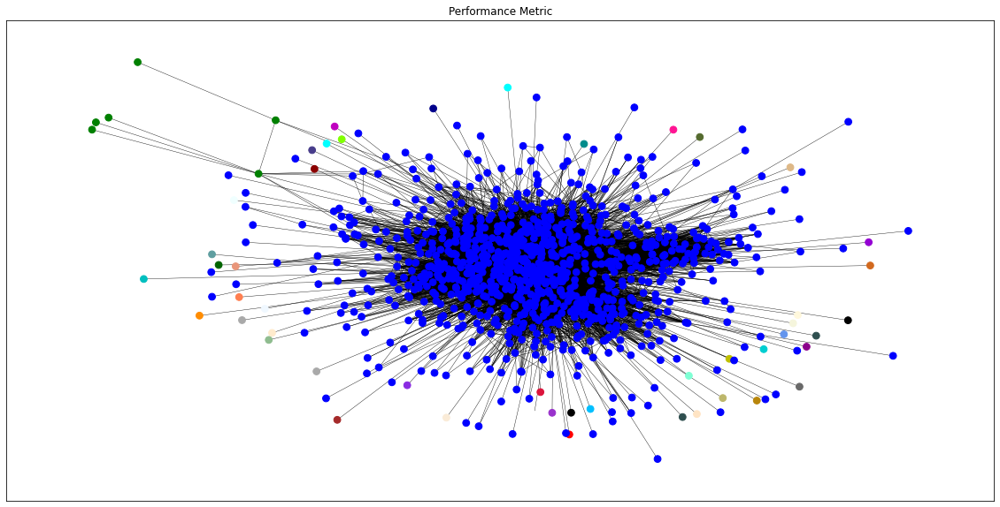

In [ ]:
#Newman-Girvan
eu_sub_colors = [0 for i in range(len(nx.nodes(eu_sub)))]

for index, community in enumerate(performance_dic["eu_sub"]["Newman-Girvan"][0]):
  for node in community:
    eu_sub_colors[node] = colors[i]


plt.figure(figsize=(20,10))
nx.draw_networkx(eu_sub, node_size=60, width=0.4, node_color=eu_sub_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

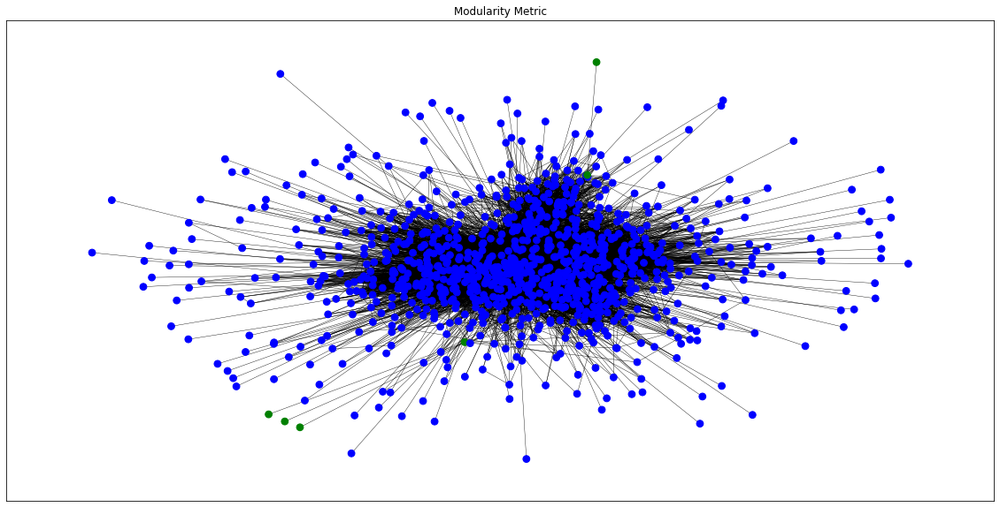

In [ ]:
#Newman-Girvan
eu_sub_colors = [0 for i in range(len(nx.nodes(eu_sub)))]

for index, community in enumerate(modularity_dic["eu_sub"]["Newman-Girvan"][0]):
  for node in community:
    eu_sub_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(eu_sub, node_size=60, width=0.4, node_color=eu_sub_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

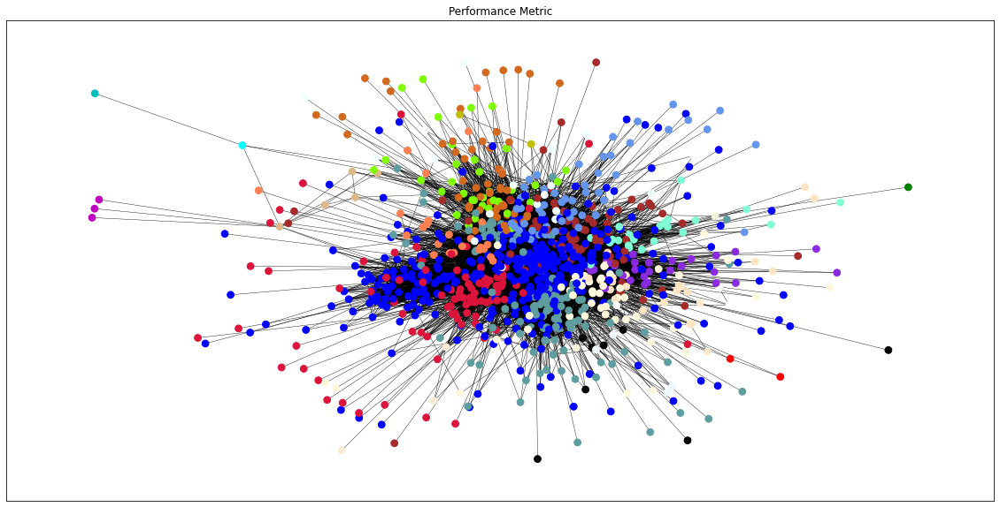

In [ ]:
#Spectral-Clustering
eu_sub_colors = [0 for i in range(len(nx.nodes(eu_sub)))]

for index, community in enumerate(performance_dic["eu_sub"]["Spectral-Clustering"][0]):
  for node in community:
    eu_sub_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(eu_sub, node_size=60, width=0.4, node_color=eu_sub_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

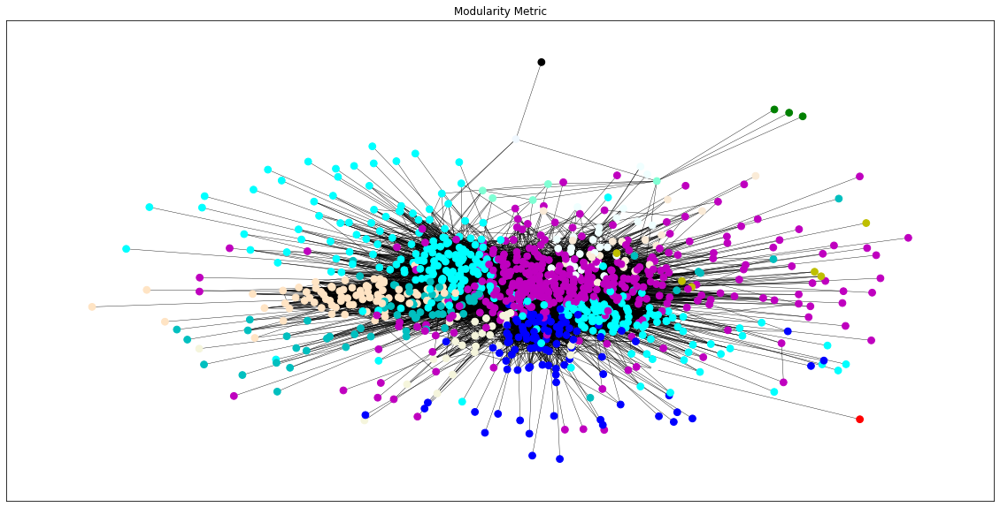

In [ ]:
#Spectral-Clustering
eu_sub_colors = [0 for i in range(len(nx.nodes(eu_sub)))]

for index, community in enumerate(modularity_dic["eu_sub"]["Spectral-Clustering"][0]):
  for node in community:
    eu_sub_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(eu_sub, node_size=60, width=0.4, node_color=eu_sub_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

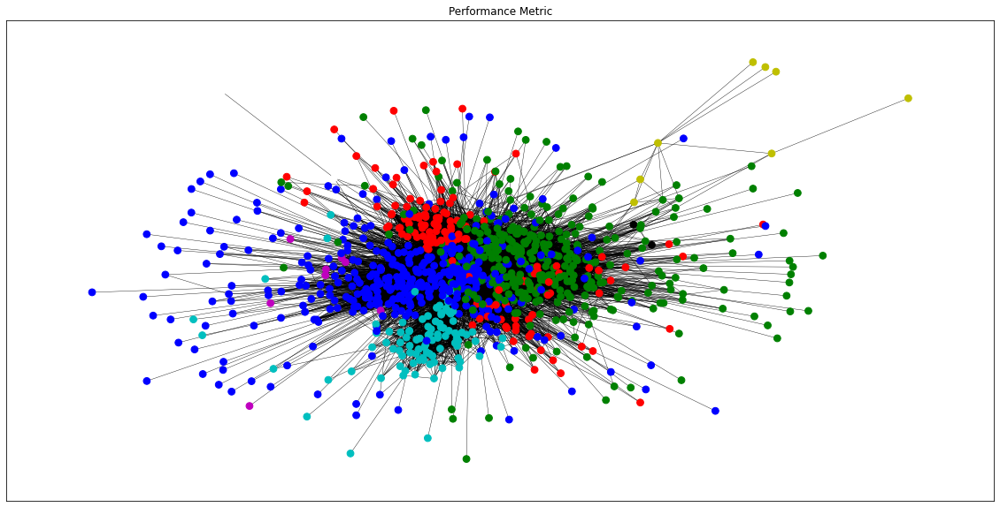

In [ ]:
#Modularity-Maximization
eu_sub_colors = [0 for i in range(len(nx.nodes(eu_sub)))]

for index, community in enumerate(performance_dic["eu_sub"]["Modularity-Maximization"][0]):
  for node in community:
    eu_sub_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(eu_sub, node_size=60, width=0.4, node_color=eu_sub_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

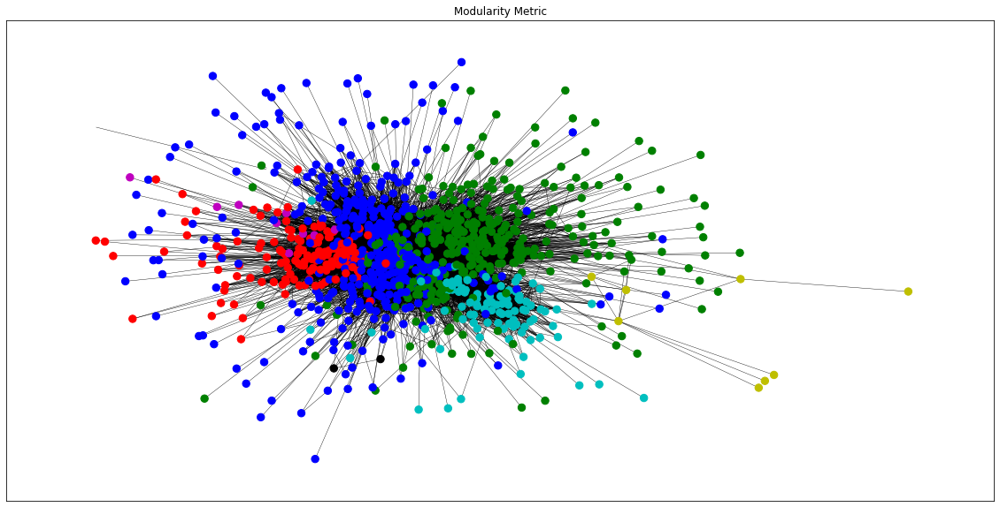

In [ ]:
#Modularity-Maximization
eu_sub_colors = [0 for i in range(len(nx.nodes(eu_sub)))]

for index, community in enumerate(modularity_dic["eu_sub"]["Modularity-Maximization"][0]):
  for node in community:
    eu_sub_colors[node] = colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(eu_sub, node_size=70, width=0.4, node_color=eu_sub_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

Στο δίκτυο eu παρατηρούμε έναν έντονο διαχωρισμό κόμβων μεταξύ κάποιων κεντρικών με πολλές συνδέσεις και άλλων με λίγες συνδέσεις. Αυτό αποτελέι χαρκτηριστικό της Scale Free τοπολογίας.

##### Ground Truth

In [ ]:
import pandas as pd
pd_eu_gt = pd.read_csv("/content/drive/MyDrive/sca/email-Eu-core-department-labels.txt",
                       delimiter=' ', header=None)
#keep the label column
labels_column = pd_eu_gt.iloc[:,1]

#array of the unique communities in the ground truth partition
labels = labels_column.unique()
labels.sort()

eu_gt = []

#for each unique label iterate the labels column and if the labels match,
#append the corresponding node (if it also belongs to the largest component)
#to the communities list
#when finished append the found community to the ground truth list.
for label in labels:
  communities = []

  communities = [node for (node, community) in enumerate(labels_column)
  if community==label and node in nx.nodes(eu_sub_int)]

  eu_gt.append(communities)

Υπολογίζουμε τα performance και modularity scores για την ground truth διαμέριση. Επίσης, σημειώνουμε και την τιμή του coverage από την μετρική performannce.

In [ ]:
eu_gt_coverage = nx.community.partition_quality(eu_sub_int, eu_gt)[0]
eu_gt_performance = nx.community.partition_quality(eu_sub_int, eu_gt)[1]
eu_gt_modularity = nx.community.quality.modularity(eu_sub_int, eu_gt)

In [ ]:
print('Performance Metric''\n')
for method in methods:
  print(str(method)+':''\n')
  print(
      """
      For the eu_sub partition the Number of communities is: {} & Performance score is: {:.4f}
      For the eu_gt partition the Number of communities is: {} & Performance score is: {:.4f}
      """.format(len(performance_dic['eu_sub'][method][0]),
                 performance_dic['eu_sub'][method][1],
                 len(eu_gt), eu_gt_performance))

print('\n''Modularity Metric''\n')
for method in methods:
  print(str(method)+':''\n')
  print(
      """
      For the eu_sub partition the Number of communities is: {} & Modularity score is: {:.4f}
      For the eu_gt partition the Number of communities is: {} & Modularity score is: {:.4f}
      """.format(len(modularity_dic['eu_sub'][method][0]),
                 modularity_dic['eu_sub'][method][1],
                 len(eu_gt), eu_gt_modularity))

print('The coverage value is {:.3f}'.format(eu_gt_coverage))

Performance Metric

Newman-Girvan:


      For the eu_sub partition the Number of communities is: 51 & Performance score is: 0.1413
      For the eu_gt partition the Number of communities is: 42 & Performance score is: 0.9362
      
Spectral-Clustering:


      For the eu_sub partition the Number of communities is: 28 & Performance score is: 0.8755
      For the eu_gt partition the Number of communities is: 42 & Performance score is: 0.9362
      
Modularity-Maximization:


      For the eu_sub partition the Number of communities is: 8 & Performance score is: 0.7079
      For the eu_gt partition the Number of communities is: 42 & Performance score is: 0.9362
      

Modularity Metric

Newman-Girvan:


      For the eu_sub partition the Number of communities is: 2 & Modularity score is: 0.0006
      For the eu_gt partition the Number of communities is: 42 & Modularity score is: 0.1901
      
Spectral-Clustering:


      For the eu_sub partition the Number of communities is: 15 & Modular

Παρατηρούμε πώς η ground truth partition πετυχαίνει καλύτερο score στην μετρική performance σε σχέση με όλες τις μεθόδους και ιδιαίτερα με την μέθοδο Newman Girvan. Η μέθοδος Spectral Clustering προσεγγίζει σημαντικά το score της ground truth διαμέρισης. Σχετικά με τα modularity scores παρατηρούμε πώς οι μέθοδοι Spectral Clustering και Modularity MAximization πετυχαίνουν υψηλότερα σκορ από αυτό της ground truth διαμέρισης.

#### Οπτικοποίηση κοινοτήτων REG

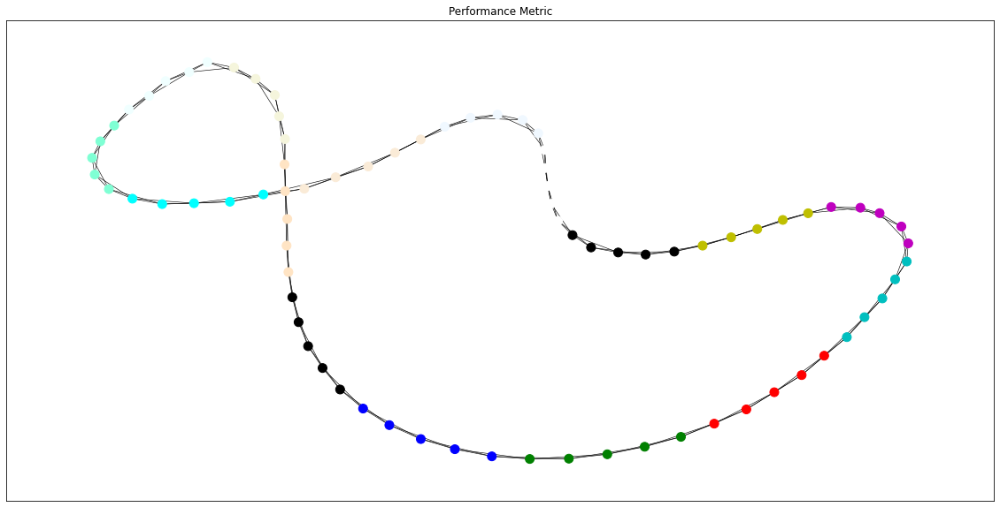

In [ ]:
#Newman-Girvan
REG_colors = [0 for i in range(len(nx.nodes(REG)))]

for index, community in enumerate(performance_dic["REG"]["Newman-Girvan"][0]):
  for node in community:
    REG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(REG, node_size=100, width=0.6, node_color=REG_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

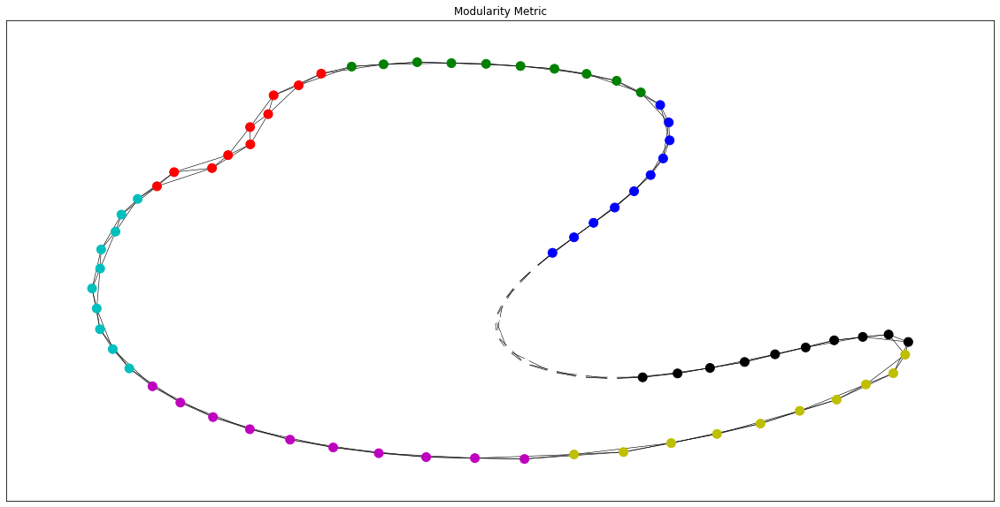

In [ ]:
#Newman-Girvan
REG_colors = [0 for i in range(len(nx.nodes(REG)))]

for index, community in enumerate(modularity_dic["REG"]["Newman-Girvan"][0]):
  for node in community:
    REG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(REG, node_size=100, width=0.6, node_color=REG_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

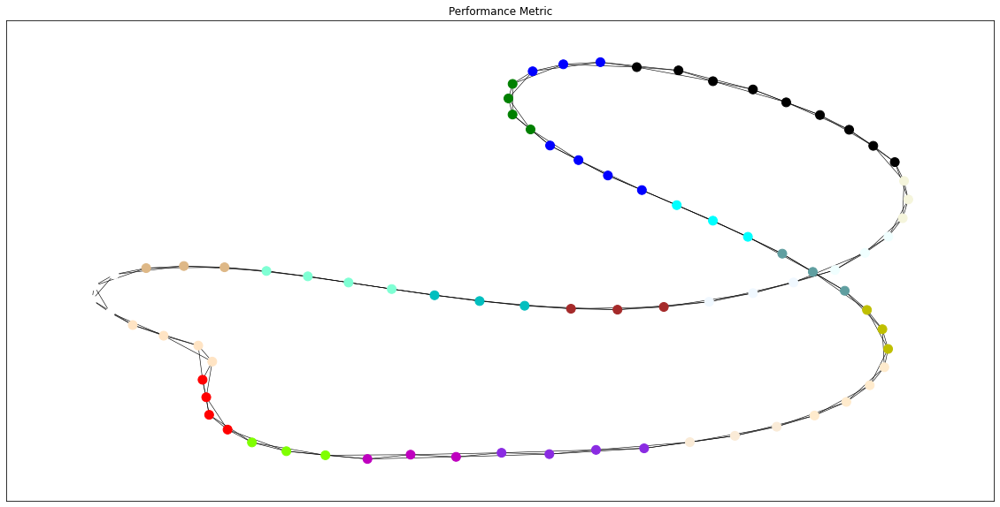

In [ ]:
#Spectral-Clustering
REG_colors = [0 for i in range(len(nx.nodes(REG)))]

for index, community in enumerate(performance_dic["REG"]["Spectral-Clustering"][0]):
  for node in community:
    REG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(REG, node_size=100, width=0.6, node_color=REG_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

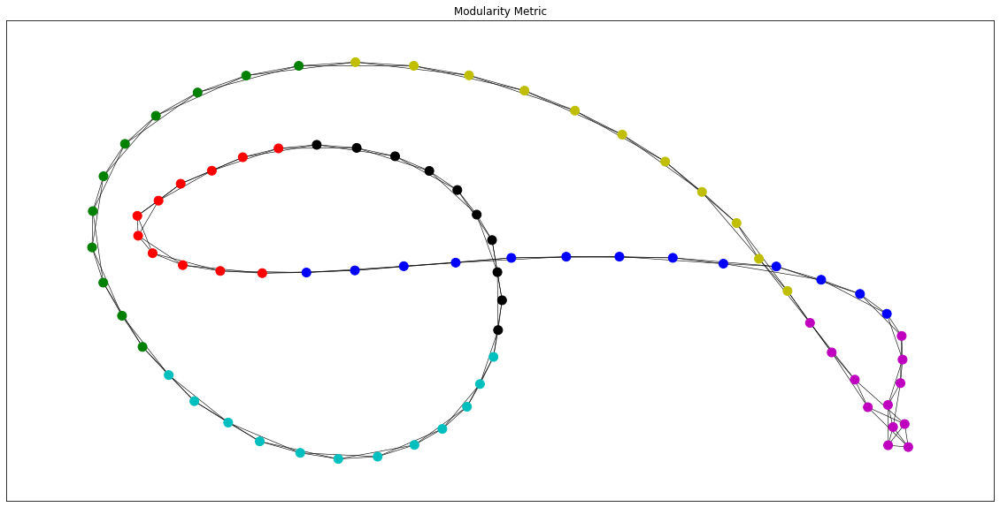

In [ ]:
#Spectral-Clustering
REG_colors = [0 for i in range(len(nx.nodes(REG)))]

for index, community in enumerate(modularity_dic["REG"]["Spectral-Clustering"][0]):
  for node in community:
    REG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(REG, node_size=100, width=0.6, node_color=REG_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

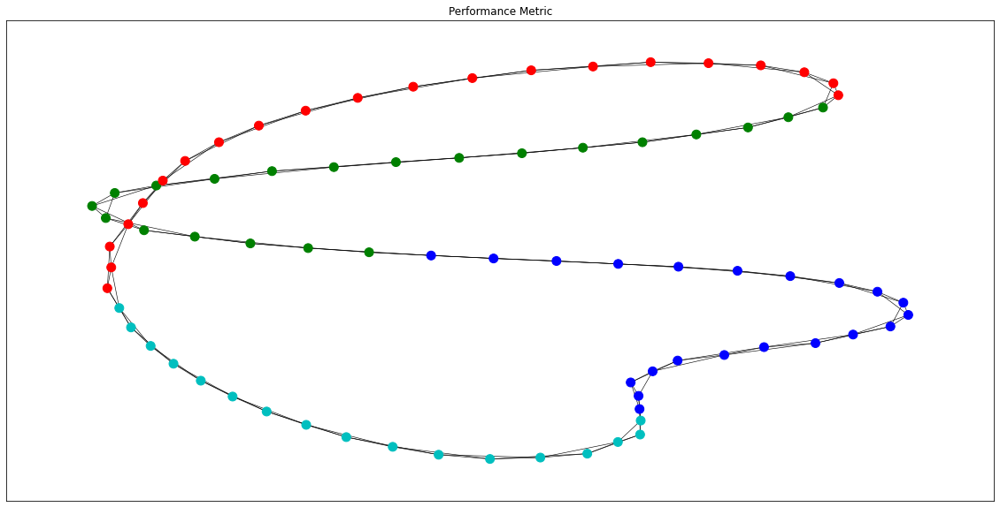

In [ ]:
#Modularity-Maximization
REG_colors = [0 for i in range(len(nx.nodes(REG)))]

for index, community in enumerate(performance_dic["REG"]["Modularity-Maximization"][0]):
  for node in community:
    REG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(REG, node_size=100, width=0.6, node_color=REG_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

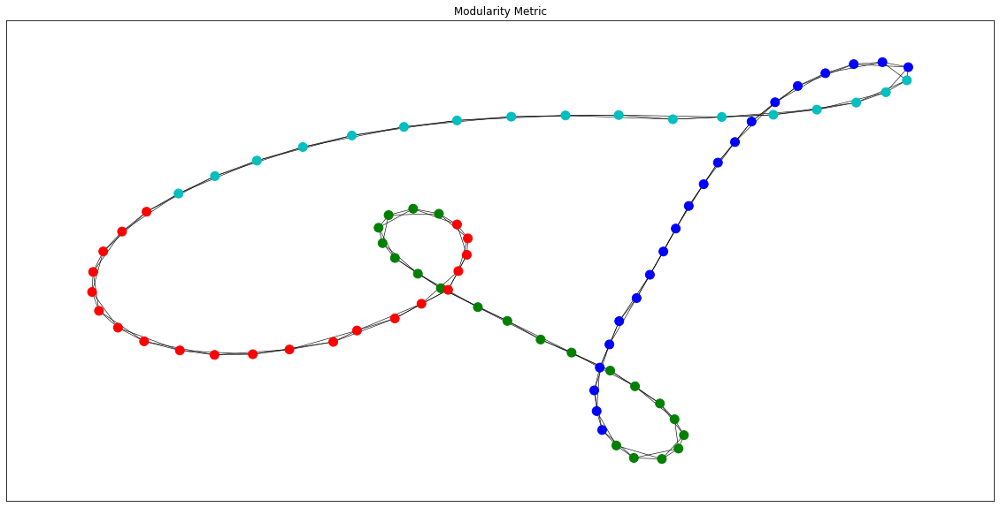

In [ ]:
#Modularity-Maximization
REG_colors = [0 for i in range(len(nx.nodes(REG)))]

for index, community in enumerate(modularity_dic["REG"]["Modularity-Maximization"][0]):
  for node in community:
    REG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(REG, node_size=100, width=0.6, node_color=REG_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

#### Οπτικοποίηση κοινοτήτων RGER

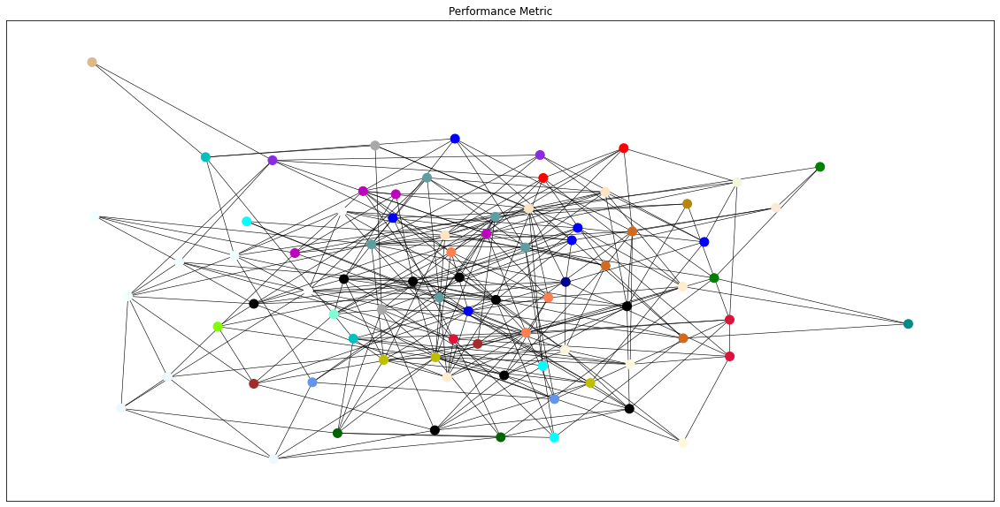

In [ ]:
#Newman-Girvan
RGER_colors = [0 for i in range(len(nx.nodes(RGER)))]

for index, community in enumerate(performance_dic["RGER"]["Newman-Girvan"][0]):
  for node in community:
    RGER_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGER, node_size=100, width=0.6, node_color=RGER_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

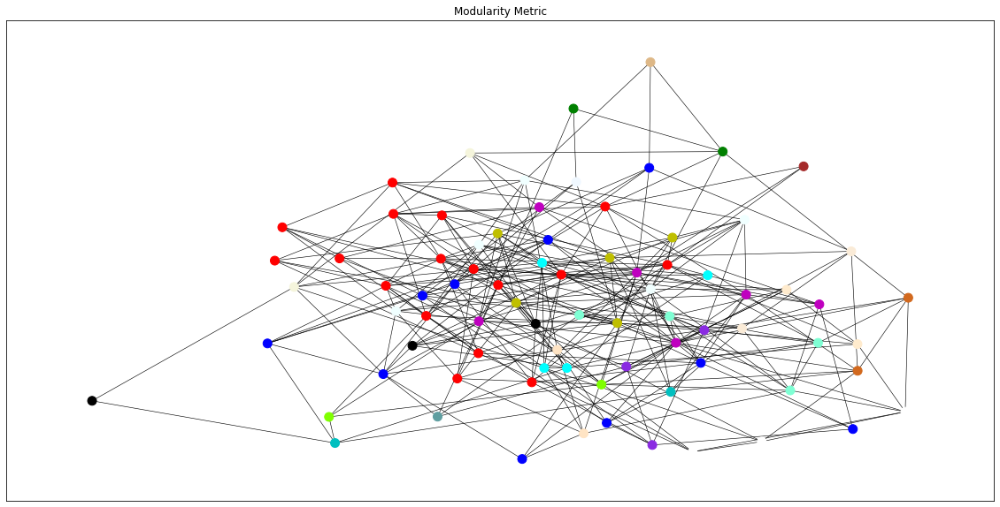

In [ ]:
#Newman-Girvan
RGER_colors = [0 for i in range(len(nx.nodes(RGER)))]

for index, community in enumerate(modularity_dic["RGER"]["Newman-Girvan"][0]):
  for node in community:
    RGER_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGER, node_size=100, width=0.6, node_color=RGER_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

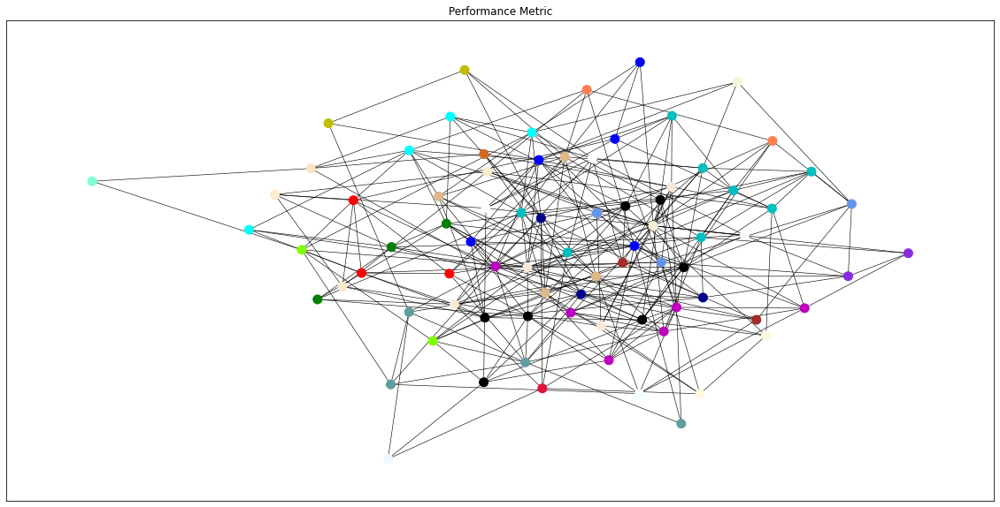

In [ ]:
#Spectral-Clustering
RGER_colors = [0 for i in range(len(nx.nodes(RGER)))]

for index, community in enumerate(performance_dic["RGER"]["Spectral-Clustering"][0]):
  for node in community:
    RGER_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGER, node_size=100, width=0.6, node_color=RGER_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

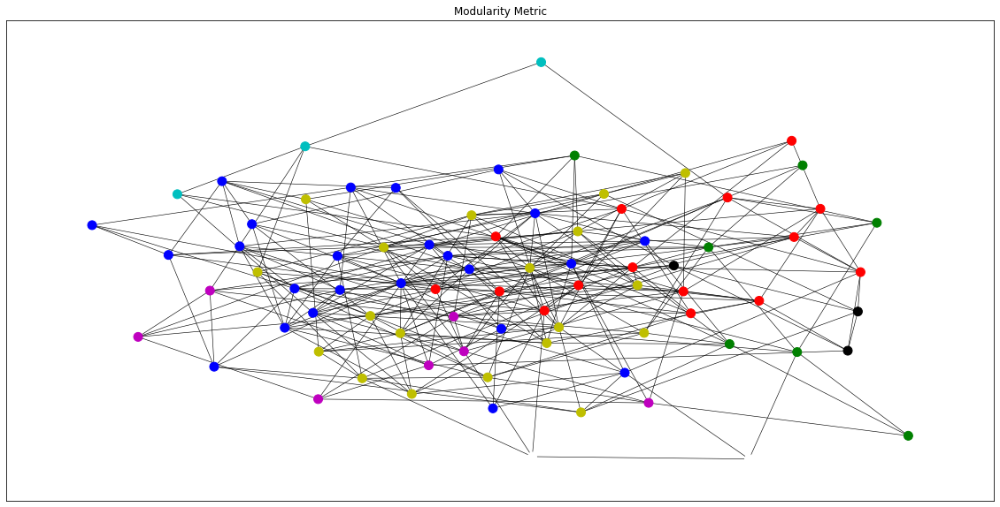

In [ ]:
#Spectral-Clustering
RGER_colors = [0 for i in range(len(nx.nodes(RGER)))]

for index, community in enumerate(modularity_dic["RGER"]["Spectral-Clustering"][0]):
  for node in community:
    RGER_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGER, node_size=100, width=0.6, node_color=RGER_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

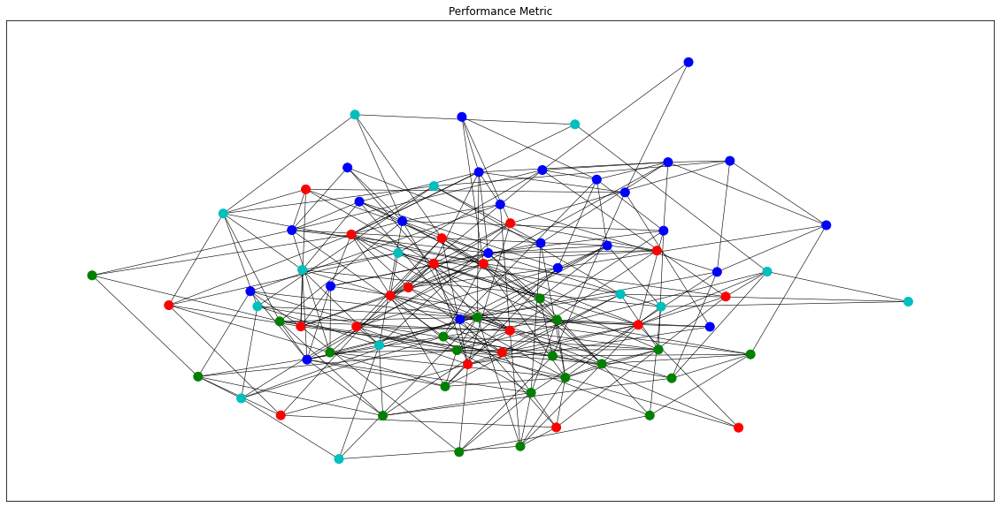

In [ ]:
#Modularity-Maximization
RGER_colors = [0 for i in range(len(nx.nodes(RGER)))]

for index, community in enumerate(performance_dic["RGER"]["Modularity-Maximization"][0]):
  for node in community:
    RGER_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGER, node_size=100, width=0.6, node_color=RGER_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

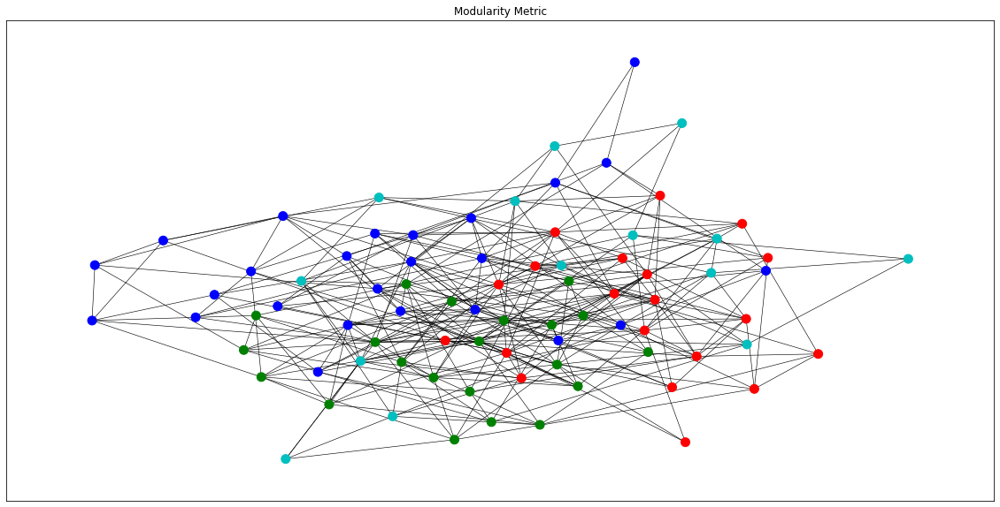

In [ ]:
#Modularity-Maximization
RGER_colors = [0 for i in range(len(nx.nodes(RGER)))]

for index, community in enumerate(modularity_dic["RGER"]["Modularity-Maximization"][0]):
  for node in community:
    RGER_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGER, node_size=100, width=0.6, node_color=RGER_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

Παρατηρούμε λιγότερο ευδιάκριτο διαχωρισμό των κοινοτήτων μεταξύ τους, κάτι που εξηγείται από την τυχαιότητα ανάθεσης ακμών στους κόμβους του γράφου.

#### Οπτικοποίηση κοινοτήτων RGG

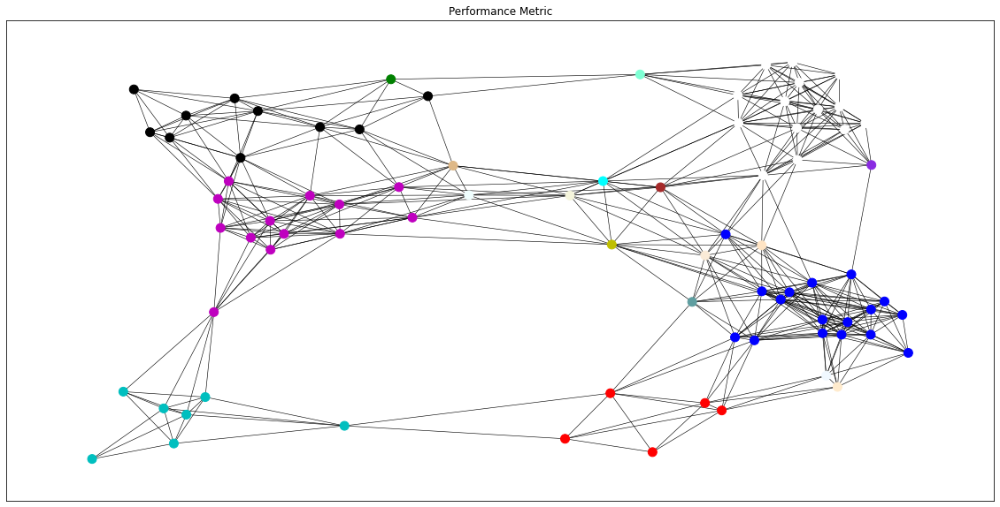

In [ ]:
#Newman-Girvan
RGG_colors = [0 for i in range(len(nx.nodes(RGG)))]

for index, community in enumerate(performance_dic["RGG"]["Newman-Girvan"][0]):
  for node in community:
    RGG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGG, node_size=100, width=0.6, node_color=RGG_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

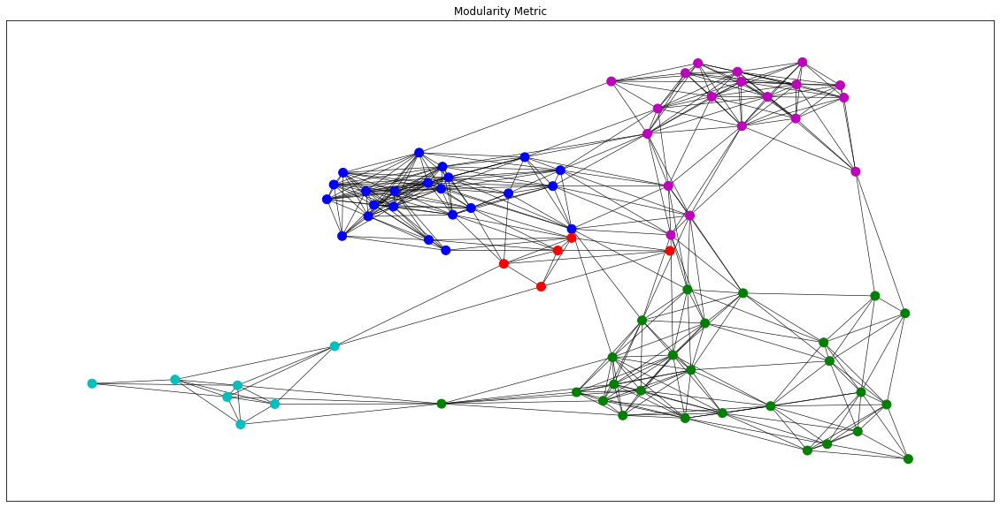

In [ ]:
#Newman-Girvan
RGG_colors = [0 for i in range(len(nx.nodes(RGG)))]

for index, community in enumerate(modularity_dic["RGG"]["Newman-Girvan"][0]):
  for node in community:
    RGG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGG, node_size=100, width=0.6, node_color=RGG_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

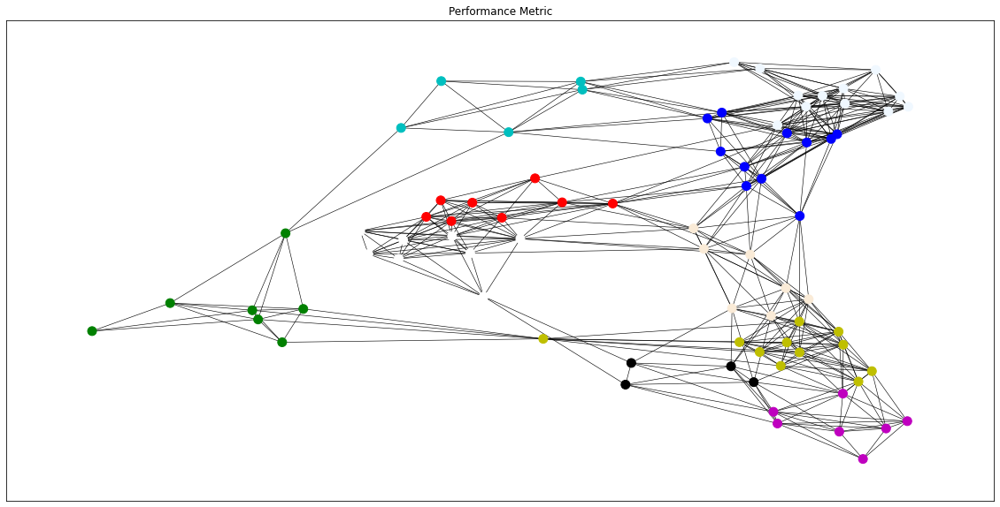

In [ ]:
#Spectral-Clustering
RGG_colors = [0 for i in range(len(nx.nodes(RGG)))]

for index, community in enumerate(performance_dic["RGG"]["Spectral-Clustering"][0]):
  for node in community:
    RGG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGG, node_size=100, width=0.6, node_color=RGG_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

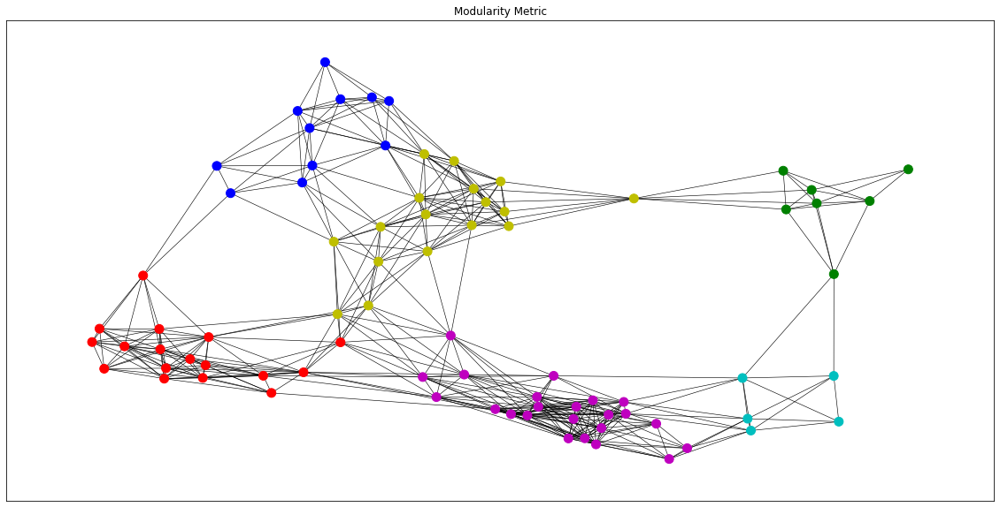

In [ ]:
#Spectral-Clustering
RGG_colors = [0 for i in range(len(nx.nodes(RGG)))]

for index, community in enumerate(modularity_dic["RGG"]["Spectral-Clustering"][0]):
  for node in community:
    RGG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGG, node_size=100, width=0.6, node_color=RGG_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

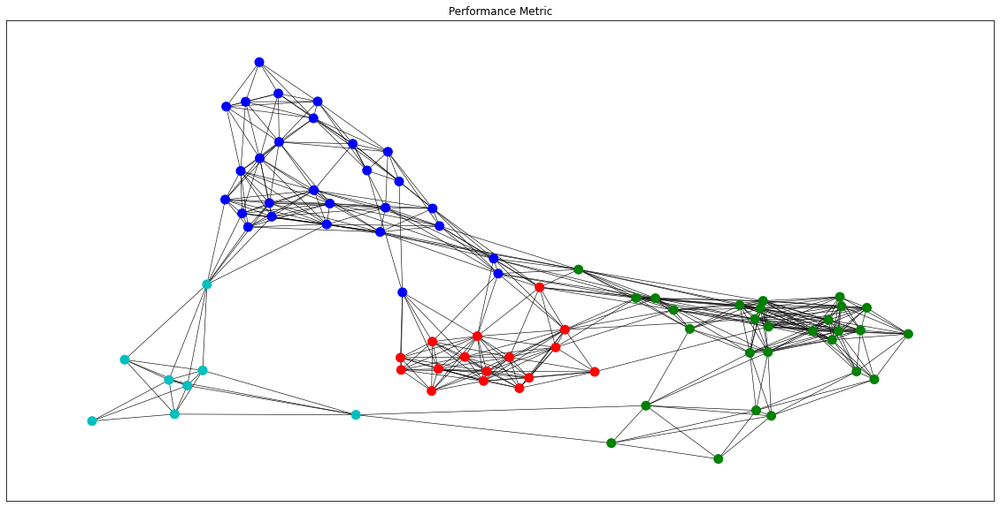

In [ ]:
#Modularity-Maximization
RGG_colors = [0 for i in range(len(nx.nodes(RGG)))]

for index, community in enumerate(performance_dic["RGG"]["Modularity-Maximization"][0]):
  for node in community:
    RGG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGG, node_size=100, width=0.6, node_color=RGG_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

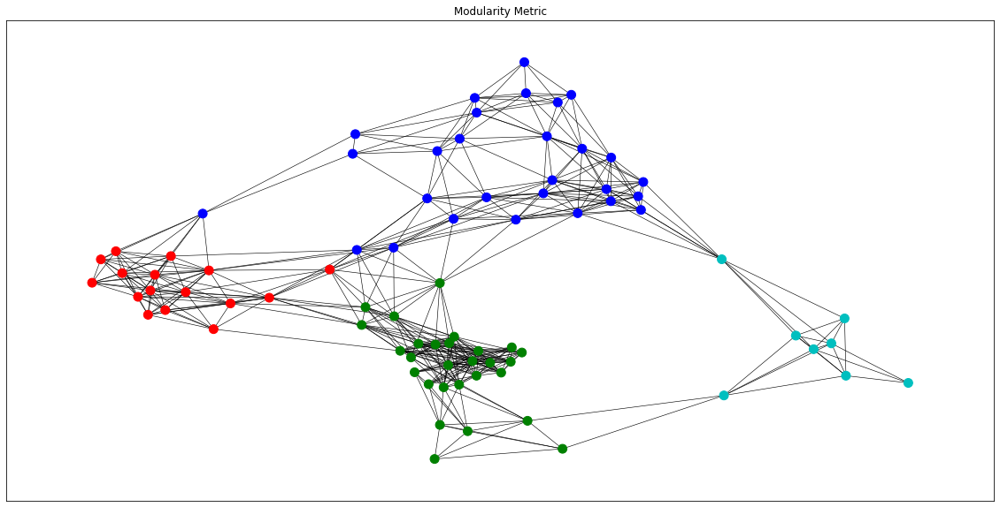

In [ ]:
#Modularity-Maximization
RGG_colors = [0 for i in range(len(nx.nodes(RGG)))]

for index, community in enumerate(modularity_dic["RGG"]["Modularity-Maximization"][0]):
  for node in community:
    RGG_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(RGG, node_size=100, width=0.6, node_color=RGG_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

Στην τοπολογία RGG παρατηρούμε σαφώς πιο ευδιάκριτη διαχώριση των κοινοτήτων σε σχέση με την RGER τοπολογία και παρατηρούμε πώς σχηματίζονται με βάση την γεωγραφική απόσταση των κόμβων μεταξύ τους.

#### Οπτικοποίηση κοινοτήτων SW

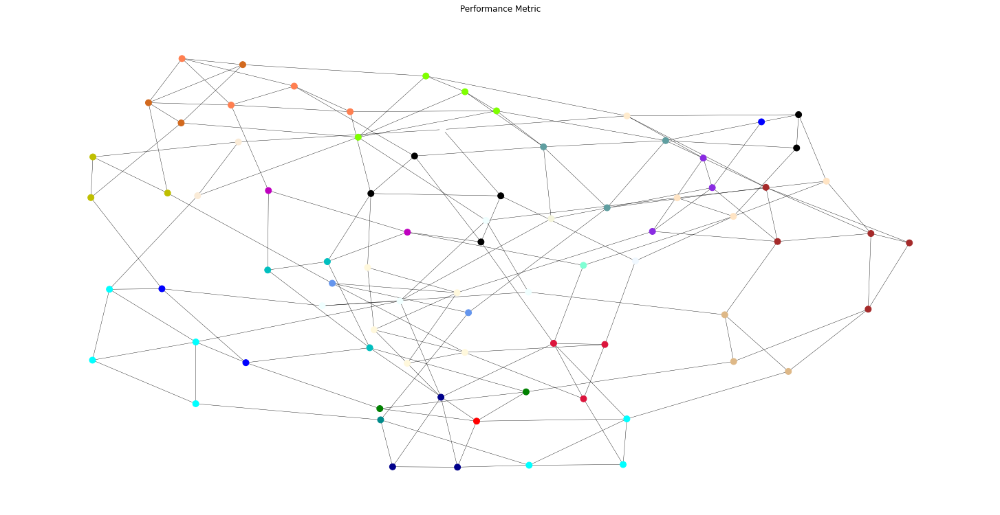

In [ ]:
#Newman-Girvan
SW_colors = [0 for i in range(len(nx.nodes(SW)))]

for index, community in enumerate(performance_dic["SW"]["Newman-Girvan"][0]):
  for node in community:
    SW_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SW, node_size=80, width=0.4, node_color=SW_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

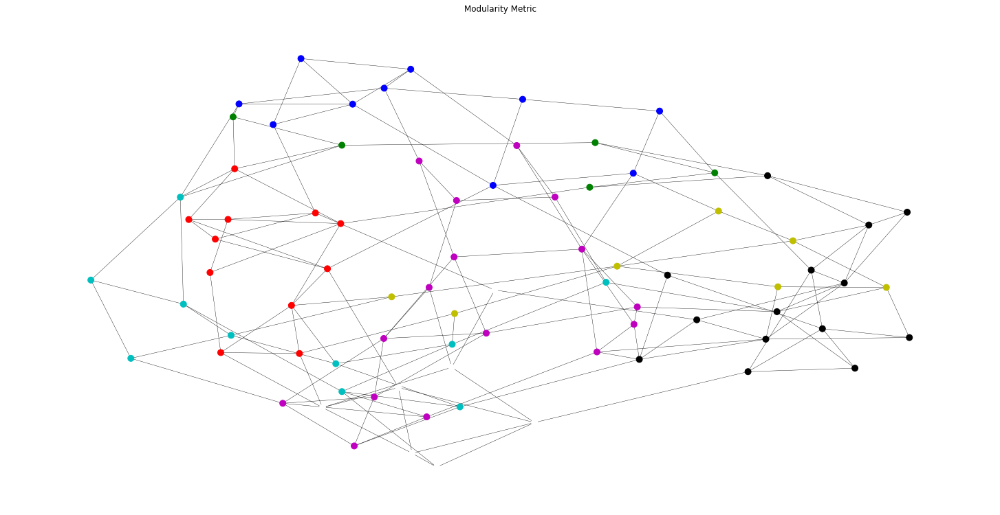

In [ ]:
#Newman-Girvan
SW_colors = [0 for i in range(len(nx.nodes(SW)))]

for index, community in enumerate(modularity_dic["SW"]["Newman-Girvan"][0]):
  for node in community:
    SW_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SW, node_size=80, width=0.4, node_color=SW_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

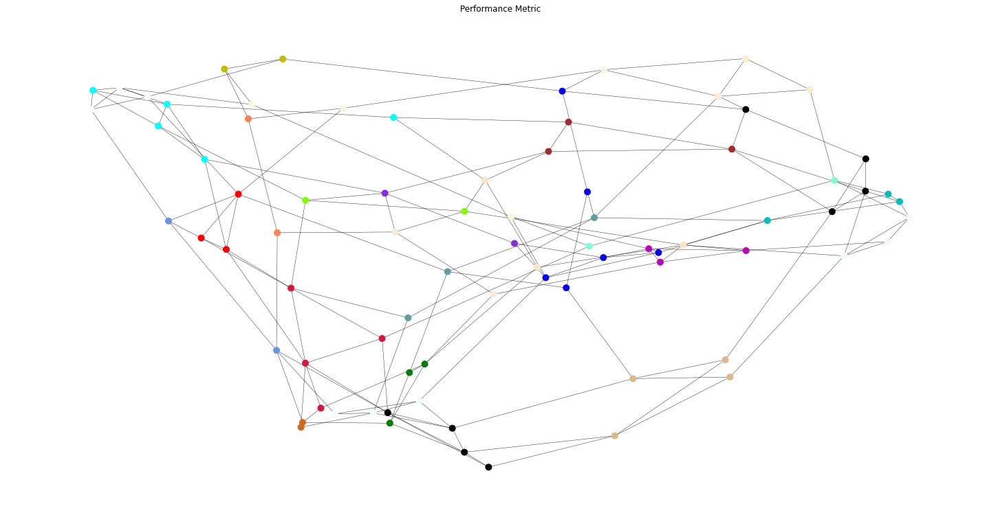

In [ ]:
#Spectral-Clustering
SW_colors = [0 for i in range(len(nx.nodes(SW)))]

for index, community in enumerate(performance_dic["SW"]["Spectral-Clustering"][0]):
  for node in community:
    SW_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spectral(SW, node_size=80, width=0.4, node_color=SW_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

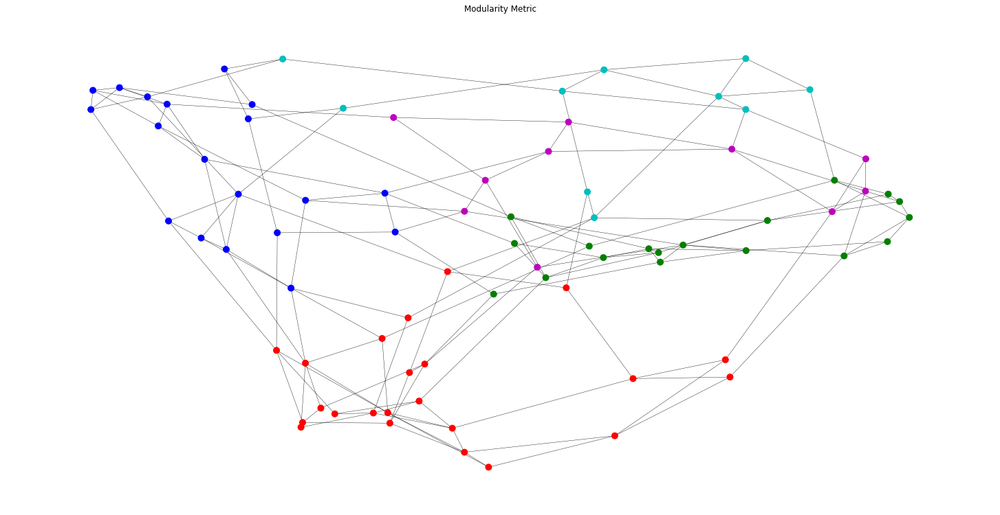

In [ ]:
#Spectral-Clustering
SW_colors = [0 for i in range(len(nx.nodes(SW)))]

for index, community in enumerate(modularity_dic["SW"]["Spectral-Clustering"][0]):
  for node in community:
    SW_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spectral(SW, node_size=80, width=0.4, node_color=SW_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

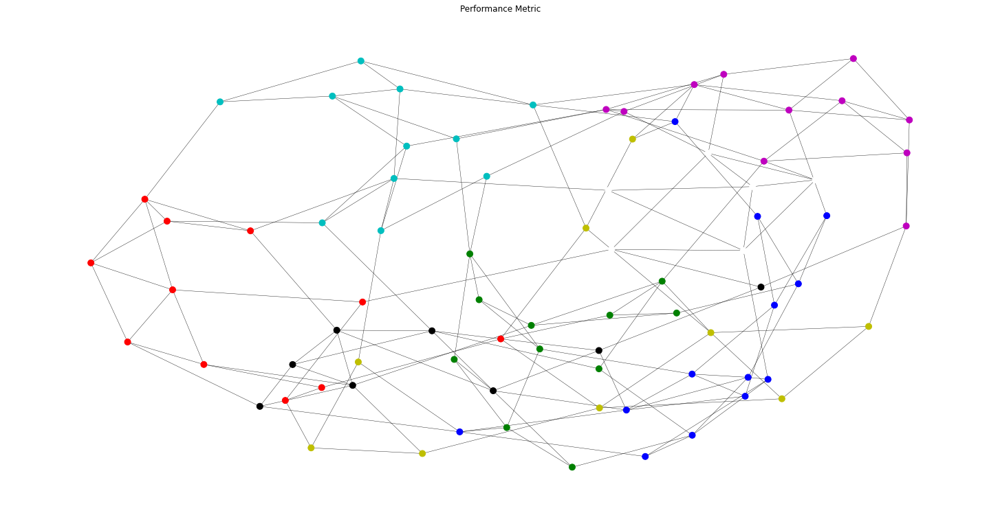

In [ ]:
#Modularity-Maximization
SW_colors = [0 for i in range(len(nx.nodes(SW)))]

for index, community in enumerate(performance_dic["SW"]["Modularity-Maximization"][0]):
  for node in community:
    SW_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SW, node_size=80, width=0.4, node_color=SW_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

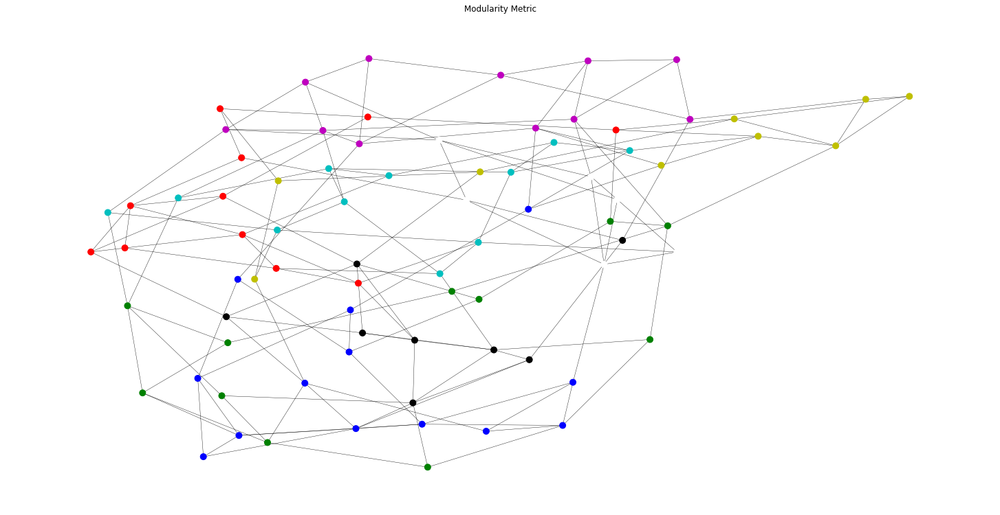

In [ ]:
#Modularity-Maximization
SW_colors = [0 for i in range(len(nx.nodes(SW)))]

for index, community in enumerate(modularity_dic["SW"]["Modularity-Maximization"][0]):
  for node in community:
    SW_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SW, node_size=80, width=0.4, node_color=SW_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

Παρατηρούμε έναν σχετικά ευδιάκριτο διαχωρισμό των κοινοτήτων και με όλες τις κοινότητες να επικοινωνούν μεταξύ τους. 

#### Οπτικοποίηση κοινοτήτων SF

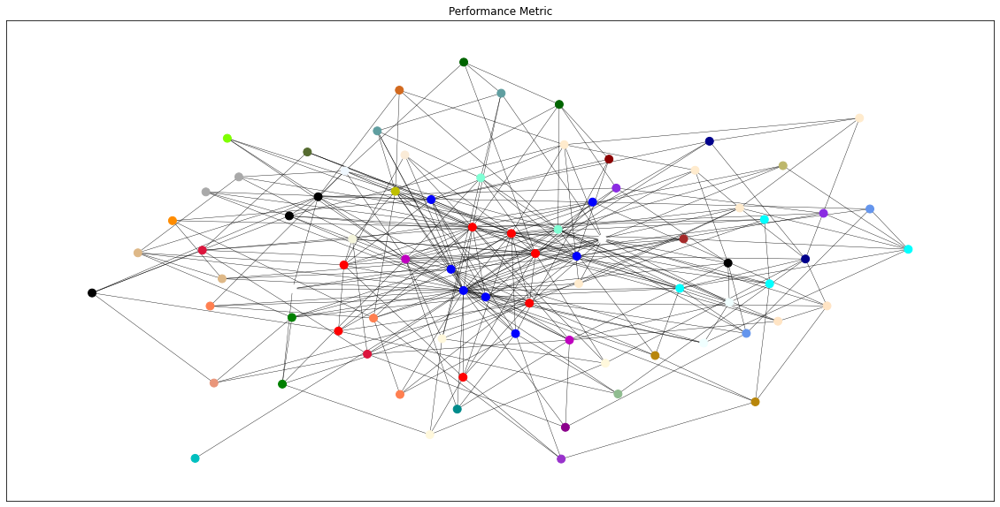

In [ ]:
#Newman-Girvan
SF_colors = [0 for i in range(len(nx.nodes(SF)))]

for index, community in enumerate(performance_dic["SF"]["Newman-Girvan"][0]):
  for node in community:
    SF_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_networkx(SF, node_size=80, width=0.4, node_color=SF_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

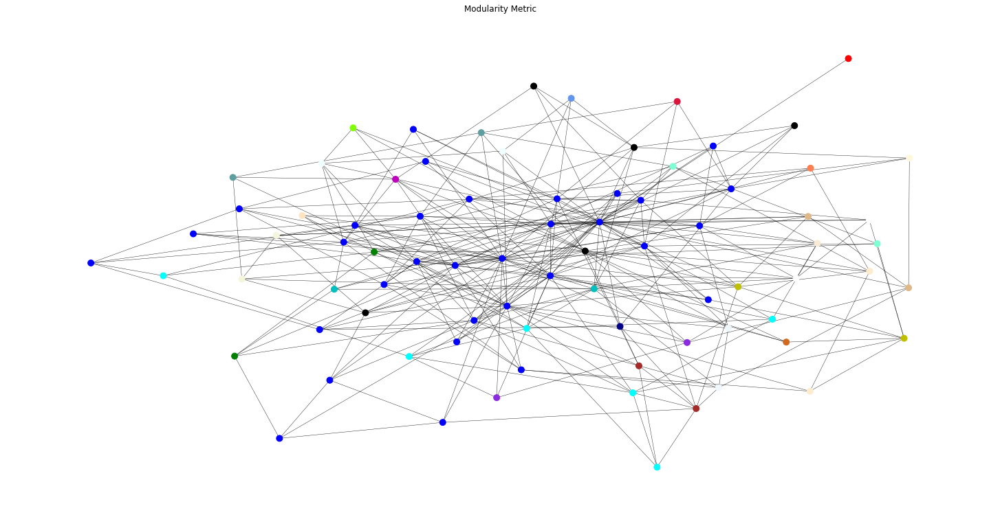

In [ ]:
#Newman-Girvan
SF_colors = [0 for i in range(len(nx.nodes(SF)))]

for index, community in enumerate(modularity_dic["SF"]["Newman-Girvan"][0]):
  for node in community:
    SF_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SF, node_size=80, width=0.4, node_color=SF_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

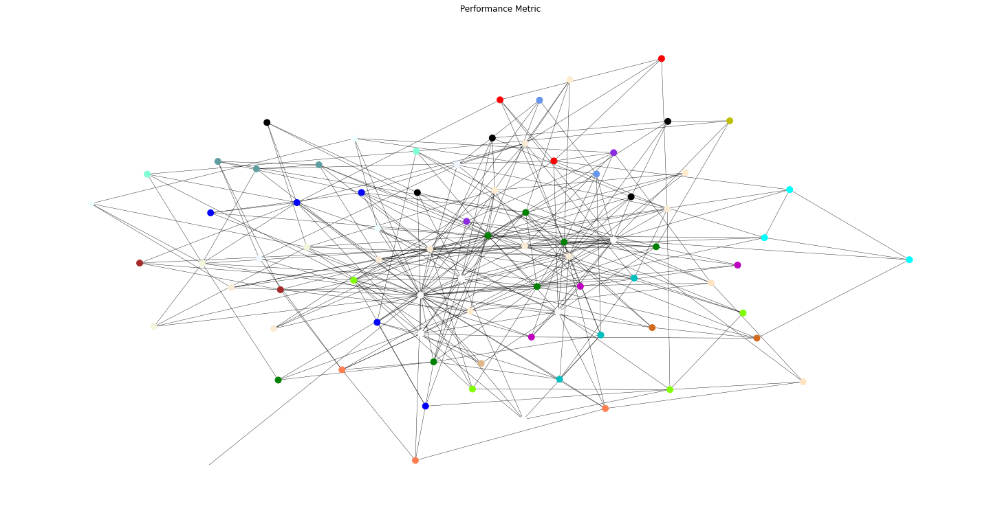

In [ ]:
#Spectral-Clustering
SF_colors = [0 for i in range(len(nx.nodes(SF)))]

for index, community in enumerate(performance_dic["SF"]["Spectral-Clustering"][0]):
  for node in community:
    SF_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SF, node_size=80, width=0.4, node_color=SF_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

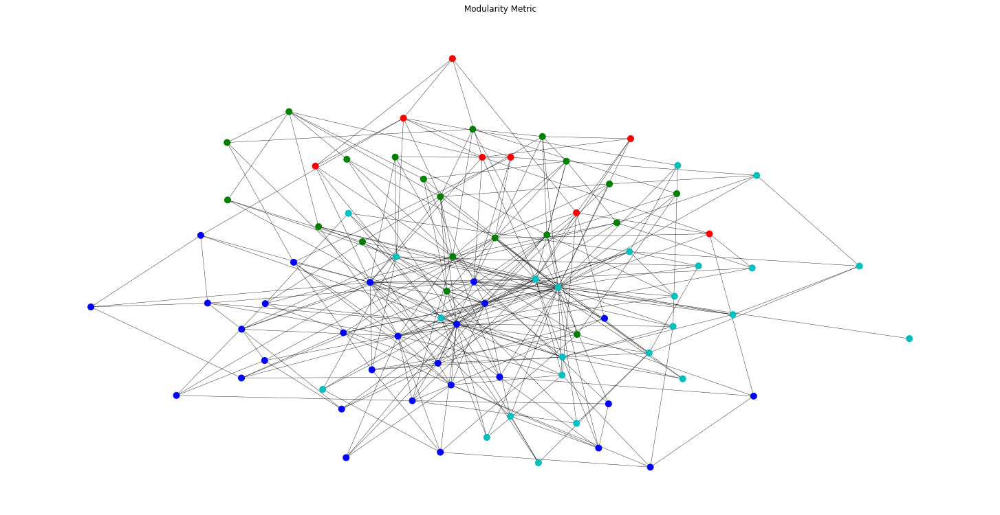

In [ ]:
#Spectral-Clustering
SF_colors = [0 for i in range(len(nx.nodes(SF)))]

for index, community in enumerate(modularity_dic["SF"]["Spectral-Clustering"][0]):
  for node in community:
    SF_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SF, node_size=80, width=0.4, node_color=SF_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

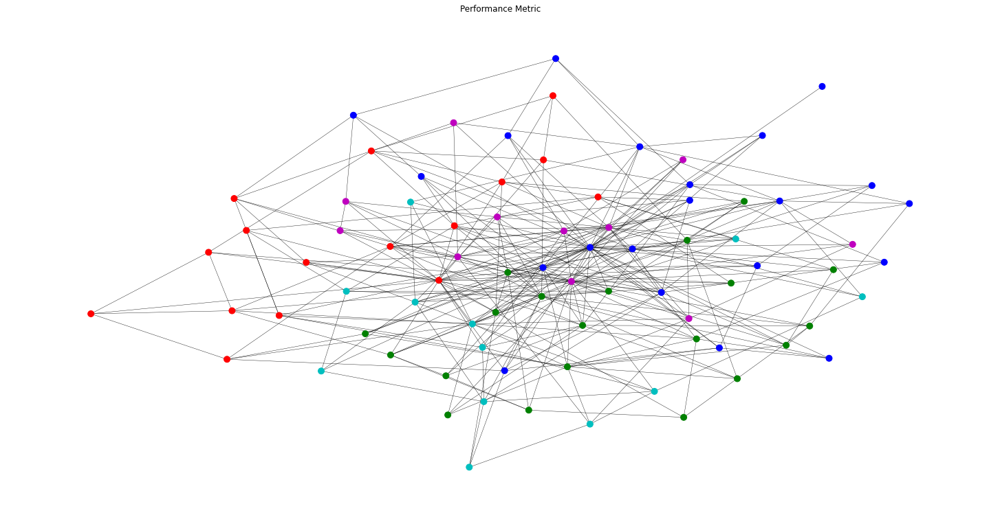

In [ ]:
#Modularity-Maximization
SF_colors = [0 for i in range(len(nx.nodes(SF)))]

for index, community in enumerate(performance_dic["SF"]["Modularity-Maximization"][0]):
  for node in community:
    SF_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SF, node_size=80, width=0.4, node_color=SF_colors, with_labels=False)
plt.title('Performance Metric')
plt.show()

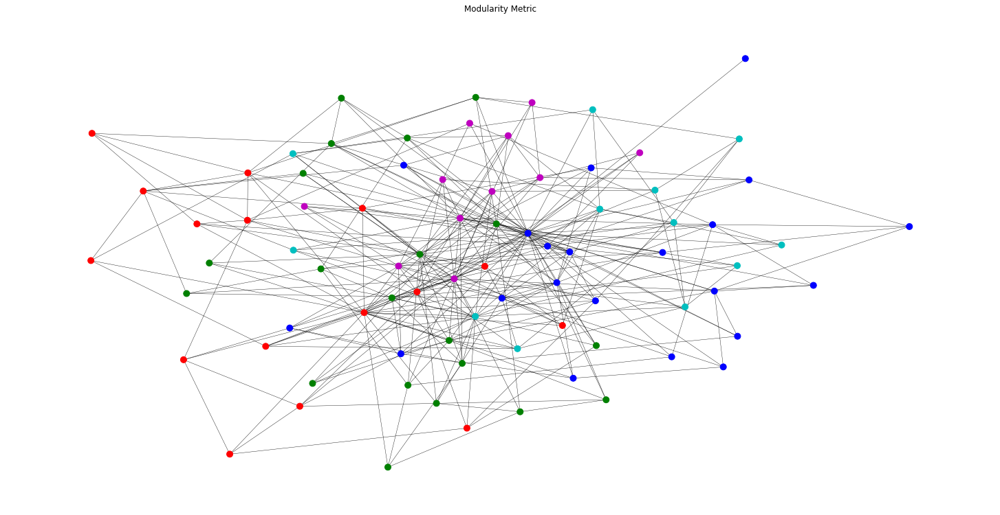

In [ ]:
#Modularity-Maximization
SF_colors = [0 for i in range(len(nx.nodes(SF)))]

for index, community in enumerate(modularity_dic["SF"]["Modularity-Maximization"][0]):
  for node in community:
    SF_colors[node]=colors[i]

plt.figure(figsize=(20,10))
nx.draw_spring(SF, node_size=80, width=0.4, node_color=SF_colors, with_labels=False)
plt.title('Modularity Metric')
plt.show()

Στην τοπολογία Scale Free παρατηρούμε την δημιουργία κοινοτήτων γύρω από κόμβους με μεγάλο βαθμό.